<a href="https://colab.research.google.com/github/descartesmbogning/Deciphering_Bacteriophage_Revolution/blob/main/1_scholar_analysis_topics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import re
from functools import reduce
import seaborn as sns
import missingno as msno
%matplotlib inline

import matplotlib.pyplot as plt
from scipy.stats import norm


In [ ]:
# Set the figure size - handy for larger output
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = [10, 6]
# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

In [ ]:
from scipy import stats #the only import you actually need for this
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}

In [ ]:
# function that tests distribution then picks test accordingly
def test_sig(x, y):
    if stats.shapiro(x).pvalue >= 0.05 and stats.shapiro(y).pvalue >= 0.05: #if they are normally distriuted
        print("t-test")
        return stats.ttest_ind(x,y)
    else:
        print("mann-whitney")
        return stats.mannwhitneyu(x, y)

## import data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
topics_data_citation = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_scholar_19.pkl').reset_index()[
    ['UT (Unique WOS ID)','Publication Year','Topic N°', 'Times Cited, All Databases']]

topics_data_citation = topics_data_citation.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID'])

topics_data_citation

,Publication Year,Topic N°,"Times Cited, All Databases"
wos_ID,,,
wos:000183215700003,2003,6,19
wos:000180955900018,2003,11,114
wos:000183683300008,2003,11,2
wos:000184760800009,2003,12,26
wos:000187153000005,2003,13,14
...,...,...,...
wos:000959867000004,2023,13,0
wos:000968835000001,2023,4,0
wos:000933339800001,2023,12,0


In [ ]:
#Import data
data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_scholar_19.pkl').reset_index()
# Filter based on 'Publication Year' column
#data = data[data['Publication Year'] >= 2003]
data = data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID'])
#data['Topic N°']  = data['Topic N°'].astype(str)
data#.head()

,Publication Year,Unnamed: 0,Publication Type,Authors,Author Full Names,Article Title,Source Title,Language,Document Type,Author Keywords,...,WoS Categories,Web of Science Index,Research Areas,IDS Number,Pubmed Id,Open Access Designations,Highly Cited Status,Hot Paper Status,Date of Export,Topic N°
wos_ID,,,,,,,,,,,,,,,,,,,,,
wos:000183215700003,2003,23829,j,"campos, ja; aledo, jc; segura, ja; alonso, fj;...","campos, ja; aledo, jc; segura, ja; alonso, fj;...",expression of recombinant human l-glutaminase ...,biochimica et biophysica acta-proteins and pro...,english,article,recombinant protein expression; human cdna; mi...,...,biochemistry & molecular biology; biophysics,science citation index expanded (sci-expanded),biochemistry & molecular biology; biophysics,684pl,12758143.0,NaN,NaN,NaN,30/06/2023,6
wos:000180955900018,2003,23830,j,"ewert, s; honegger, a; pluckthun, a","ewert, s; honegger, a; pluckthun, a",structure-based improvement of the biophysical...,biochemistry,english,article,NaN,...,biochemistry & molecular biology,science citation index expanded (sci-expanded),biochemistry & molecular biology,645bg,12578364.0,NaN,NaN,NaN,30/06/2023,11
wos:000183683300008,2003,23831,j,"gottfried, p; silberstein, n; yagil, e; kolot, m","gottfried, p; silberstein, n; yagil, e; kolot, m",activity of coliphage hk022 excisionase (xis) ...,febs letters,english,article,site-specific recombination; excisionase; bact...,...,biochemistry & molecular biology; biophysics; ...,science citation index expanded (sci-expanded),biochemistry & molecular biology; biophysics; ...,692wm,12804763.0,"green submitted, bronze",NaN,NaN,30/06/2023,11
wos:000184760800009,2003,23832,j,"enriquez, c; alum, a; suarez-rey, em; choi, cy...","enriquez, c; alum, a; suarez-rey, em; choi, cy...",bacteriophages ms2 and prd1 in turfgrass by su...,journal of environmental engineering-asce,english,article,vegetation; contamination; trickle irrigation;...,...,"engineering, environmental; engineering, civil...",science citation index expanded (sci-expanded),engineering; environmental sciences & ecology,711vb,NaN,NaN,NaN,NaN,30/06/2023,12
wos:000187153000005,2003,23833,j,"heigstrand, c; wikoff, wr; duda, rl; hendrix, ...","heigstrand, c; wikoff, wr; duda, rl; hendrix, ...",the refined structure of a protein catenane: t...,journal of molecular biology,english,article,bacteriophage hk97; crystal structure; chain m...,...,biochemistry & molecular biology,science citation index expanded (sci-expanded),biochemistry & molecular biology,752gp,NaN,NaN,NaN,NaN,30/06/2023,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wos:000959867000004,2023,61561,j,"farrell, jd; dobnikar, j; podgornik, r","farrell, james daniel; dobnikar, jure; podgorn...",role of genome topology in the stability of vi...,physical review research,english,article,NaN,...,"physics, multidisciplinary",emerging sources citation index (esci),physics,c1vb9,NaN,gold,NaN,NaN,30/06/2023,13
wos:000968835000001,2023,61562,j,"lan, jx; wu, y; lin, cm; chen, jz; zhu, rq; ma...","lan, jinxin; wu, yao; lin, changmei; chen, jia...",totally-green cellulosic fiber with prominent ...,chemical engineering journal,english,article,guanylated chitosan oligosaccharide; cellulose...,...,"engineering, environmental; engineering, chemical",science citation index expanded (sci-expanded),engineering,d4zp0,36992868.0,"bronze, green published",NaN,NaN,30/06/2023,4
wos:000933339800001,2023,61563,j,"hirao, r; shigetoh, k; inagaki, s; ishida, n","hirao, rie; shigetoh, keisuke; inagaki, shinji...",virus inactivation based on optimal surfactant...,acs applied bio materials,english,article; early access,virus inactivation; mesoporous silica; surfact...,...,nanoscience & nanotechnology; materials scienc...,emerging sources citation index (esci),science & technology - other topics; materials...,8z4gw,36780326.0,hybrid,NaN,NaN,30/06/2023,12


In [ ]:
# Check the number of papers
num_papers = data.shape[0]
print(f"Number of Papers: {num_papers}")


Number of Papers: 36202


In [ ]:
df = data[['Publication Year','Topic N°']].reset_index()

pivot_df = pd.pivot_table(df, values='wos_ID', index='Topic N°', columns='Publication Year', aggfunc='count', fill_value=0)

pivot_df

Publication Year,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Topic N°,,,,,,,,,,,,,,,,,,,,,
0,44,52,48,42,38,44,34,38,27,28,...,40,32,34,21,32,24,27,18,37,12
1,32,35,49,54,66,91,69,84,115,103,...,146,143,150,190,196,207,211,277,326,165
2,136,114,108,118,116,120,113,127,150,122,...,108,115,133,106,91,86,98,97,108,45
3,101,86,77,91,93,69,59,62,71,81,...,62,53,61,62,48,53,36,32,47,27
4,57,67,53,57,94,87,100,99,111,129,...,133,136,138,163,163,135,167,185,210,106
5,108,116,112,106,93,102,109,121,145,183,...,160,162,184,182,200,255,218,257,337,117
6,197,204,195,219,219,207,203,210,200,182,...,234,201,229,195,181,199,184,195,221,88
7,85,87,76,68,54,58,58,58,55,61,...,60,48,46,45,60,42,46,39,66,17
8,98,68,81,93,129,90,92,112,138,159,...,159,174,212,235,265,270,354,365,468,227


In [ ]:
pivot_df_percent = pivot_df.div(pivot_df.sum(axis=1), axis=0)
pivot_df_percent['Total'] = pivot_df_percent.sum(axis=1)
pivot_df_percent

Publication Year,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,Total
Topic N°,,,,,,,,,,,,,,,,,,,,,
0,0.062235,0.073550,0.067893,0.059406,0.053748,0.062235,0.048091,0.053748,0.038190,0.039604,...,0.045262,0.048091,0.029703,0.045262,0.033946,0.038190,0.025460,0.052334,0.016973,1.0
1,0.011299,0.012359,0.017302,0.019068,0.023305,0.032133,0.024364,0.029661,0.040607,0.036370,...,0.050494,0.052966,0.067090,0.069209,0.073093,0.074506,0.097811,0.115113,0.058263,1.0
2,0.058419,0.048969,0.046392,0.050687,0.049828,0.051546,0.048540,0.054553,0.064433,0.052405,...,0.049399,0.057131,0.045533,0.039089,0.036942,0.042096,0.041667,0.046392,0.019330,1.0
3,0.075542,0.064323,0.057592,0.068063,0.069559,0.051608,0.044129,0.046372,0.053104,0.060583,...,0.039641,0.045625,0.046372,0.035901,0.039641,0.026926,0.023934,0.035153,0.020194,1.0
4,0.022754,0.026747,0.021158,0.022754,0.037525,0.034731,0.039920,0.039521,0.044311,0.051497,...,0.054291,0.055090,0.065070,0.065070,0.053892,0.066667,0.073852,0.083832,0.042315,1.0
5,0.031459,0.033790,0.032625,0.030877,0.027090,0.029712,0.031751,0.035246,0.042237,0.053306,...,0.047189,0.053597,0.053015,0.058258,0.074279,0.063501,0.074862,0.098165,0.034081,1.0
6,0.047140,0.048816,0.046662,0.052405,0.052405,0.049533,0.048576,0.050251,0.047858,0.043551,...,0.048098,0.054798,0.046662,0.043312,0.047619,0.044030,0.046662,0.052883,0.021058,1.0
7,0.072034,0.073729,0.064407,0.057627,0.045763,0.049153,0.049153,0.049153,0.046610,0.051695,...,0.040678,0.038983,0.038136,0.050847,0.035593,0.038983,0.033051,0.055932,0.014407,1.0
8,0.024898,0.017276,0.020579,0.023628,0.032774,0.022866,0.023374,0.028455,0.035061,0.040396,...,0.044207,0.053862,0.059705,0.067327,0.068598,0.089939,0.092734,0.118902,0.057673,1.0


# Publications trends

In [ ]:
data_trend = data['Publication Year'].value_counts().reset_index().sort_values('index')
# Rename columns
data_trend.columns = ['Year', 'Publication Count']
data_trend

,Year,Publication Count
16,2003,1451
17,2004,1438
19,2005,1343
18,2006,1431
13,2007,1491
15,2008,1480
14,2009,1483
12,2010,1573
11,2011,1682
8,2012,1728


In [ ]:
data_trend = data['Topic N°'].value_counts().reset_index().sort_values('index')
# Rename columns
data_trend.columns = ['Topic N°', 'count']
data_trend

,Topic N°,count
15,0,707
3,1,2832
5,2,2328
12,3,1337
4,4,2505
2,5,3433
0,6,4179
13,7,1180
1,8,3936
16,9,605


In [ ]:
# Patents data
#years_patent = data_trend['Year'].to_list()[:-1]   # Truncated for brevity
#counts_patent = [112, 156, 115, 126, 119, 114, 172, 156, 192, 176, 190, 223, 266, 287, 270, 395, 412, 416, 526, 516]    #, 169    # Truncated for brevity

# countries, region and income

## import data

In [ ]:
#Import data
country_data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/countries_all.pkl').reset_index()
# Filter based on 'Publication Year' column
country_data = country_data[country_data['Publication Year'] >= 2003]
country_data = country_data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID','Publication Year'])
country_data.head(3)

,,Addresses,United States,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,Vietnam,Yemen,Zambia,Zimbabwe,Bahamas,Bosnia and Herzegovina,Montenegro,Macau,Seychelles,Vatican
wos_ID,Publication Year,,,,,,,,,,,,,,,,,,,,,
wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, swi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:000183683300008,2003,"tel aviv univ, dept biochem, il-69978 tel aviv...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
country_data_topics = pd.concat([country_data, data[['Topic N°','Publication Year']].reset_index().set_index(['wos_ID','Publication Year'])], axis=1).reset_index().set_index(['wos_ID','Publication Year','Addresses'])
# Drop columns where all elements are NaN
#country_data_topics.dropna(axis=1, how='all', inplace=True)
country_data_topics.head(2)

,,,United States,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,...,Yemen,Zambia,Zimbabwe,Bahamas,Bosnia and Herzegovina,Montenegro,Macau,Seychelles,Vatican,Topic N°
wos_ID,Publication Year,Addresses,,,,,,,,,,,,,,,,,,,,,
wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept biol mol & bioquim, malaga 29071, spain",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0
wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, switzerland",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0


In [ ]:
#country_data_topics.reset_index().drop(['wos_ID','Publication Year','Addresses'], axis=1)

In [ ]:
import pandas as pd
import numpy as np


df = country_data_topics.reset_index().drop(['wos_ID','Publication Year','Addresses'], axis=1)
index = df.index.to_list()
#df['Topic N°']  = df['Topic N°'].astype(int)
# Melt the DataFrame
df_melted = df.reset_index().melt(id_vars=['index', 'Topic N°'], var_name='Country', value_name='Value')

# Drop rows where 'Value' is NaN, as they don't contribute to the count
df_melted = df_melted.dropna(subset=['Value'])

# Create a pivot table
pivot_df = pd.pivot_table(df_melted, values='Value', index='Country', columns='Topic N°', aggfunc='count', fill_value=0)

pivot_df


Topic N°,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0
Country,,,,,,,,,,,,,,,,,,,
Albania,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,2,0
Algeria,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0
Argentina,1,6,6,0,25,21,14,4,72,6,2,4,17,0,4,0,11,19,0
Armenia,0,3,0,0,0,1,1,1,5,0,0,0,1,1,0,0,0,0,1
Australia,17,147,59,22,44,156,113,13,139,38,33,59,98,20,56,12,39,49,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,0,0,0,0,2,3,1,0,3,0,0,0,1,0,1,0,0,0,0
Vietnam,0,5,2,0,3,10,4,1,21,6,2,1,6,8,4,0,2,13,0
Yemen,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0


In [ ]:
pivot_df_percent = pivot_df.div(pivot_df.sum(axis=1), axis=0)
pivot_df_percent['Total'] = pivot_df_percent.sum(axis=1)
pivot_df_percent

Topic N°,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,Total
Country,,,,,,,,,,,,,,,,,,,,
Albania,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,1.0
Algeria,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.250000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,1.0
Argentina,0.004717,0.028302,0.028302,0.000000,0.117925,0.099057,0.066038,0.018868,0.339623,0.028302,0.009434,0.018868,0.080189,0.000000,0.018868,0.000000,0.051887,0.089623,0.000000,1.0
Armenia,0.000000,0.214286,0.000000,0.000000,0.000000,0.071429,0.071429,0.071429,0.357143,0.000000,0.000000,0.000000,0.071429,0.071429,0.000000,0.000000,0.000000,0.000000,0.071429,1.0
Australia,0.015111,0.130667,0.052444,0.019556,0.039111,0.138667,0.100444,0.011556,0.123556,0.033778,0.029333,0.052444,0.087111,0.017778,0.049778,0.010667,0.034667,0.043556,0.009778,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,0.000000,0.000000,0.000000,0.000000,0.181818,0.272727,0.090909,0.000000,0.272727,0.000000,0.000000,0.000000,0.090909,0.000000,0.090909,0.000000,0.000000,0.000000,0.000000,1.0
Vietnam,0.000000,0.056818,0.022727,0.000000,0.034091,0.113636,0.045455,0.011364,0.238636,0.068182,0.022727,0.011364,0.068182,0.090909,0.045455,0.000000,0.022727,0.147727,0.000000,1.0
Yemen,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0


In [ ]:
import pandas as pd

# Assuming you have your DataFrame loaded as df
# Example:
# df = pd.read_csv('your_data.csv')
country_data_with_Global_North = country_data.copy()
# List of Global South countries
global_south = ['Afghanistan', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belize', 'Benin', 'Bhutan',
                'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei Darussalam', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Cape Verde',
                'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', "Côte d'Ivoire", 'Cuba', "Democratic People's Republic of Korea",
                'Democratic Republic of the Congo', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea',
                'Ethiopia', 'Fiji', 'Gabon', 'Gambia', 'Ghana', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'India', 'Indonesia',
                'Iran',  'Iraq', 'Jamaica', 'Jordan', 'Kenya', 'Kiribati', 'Kuwait', 'Lao',  'Lebanon', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Malaysia',
                'Maldives', 'Mali', 'Marshall Islands', 'Mauritania', 'Mauritius', 'Micronesia',  'Mongolia', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nauru',
                'Nepal', 'Nicaragua', 'Niger', 'Nigeria', 'Oman', 'Pakistan', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Qatar', 'Rwanda',
                'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'Sao Tome and Principe', 'Saudi Arabia', 'Senegal', 'Seychelles',
                'Sierra Leone', 'Singapore', 'Solomon Islands', 'Somalia', 'South Africa', 'South Sudan', 'Sri Lanka', 'State of Palestine', 'Sudan', 'Suriname',
                'Swaziland', 'Syrian',  'Tajikistan', 'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkmenistan', 'Uganda',
                'United Arab Emirates', 'Tanzania', 'Uruguay', 'Vanuatu', 'Venezuela', 'Viet Nam', 'Yemen', 'Zambia', 'Zimbabwe',
               'Congo Republic','North Korea','DR Congo','Laos','Micronesia, Fed. Sts.','St. Kitts and Nevis','St. Lucia','St. Vincent and the Grenadines',
                'Eswatini','Vietnam','Syria','Palestine',"Cote d'Ivoire",'Cabo Verde']


# Determine Global North columns
global_north_columns = [col for col in country_data_with_Global_North.columns if col not in global_south and col != 'Addresses']

# Create a new column for Global North
country_data_with_Global_North['Global North'] = country_data_with_Global_North[global_north_columns].sum(axis=1)

# Create a new column for Global North without United States
global_north_without_us_columns = [col for col in global_north_columns if col != 'United States']
country_data_with_Global_North['Global North Without US'] = country_data_with_Global_North[global_north_without_us_columns].sum(axis=1)

# Replace zeros with NaN in the new columns
country_data_with_Global_North['Global North'].replace(0, np.nan, inplace=True)
country_data_with_Global_North['Global North Without US'].replace(0, np.nan, inplace=True)

# Save the updated DataFrame to a new CSV file
country_data_with_Global_North.to_csv('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/updated_country_data_with_Global_North.csv', index=False)

# Now df should have two new columns, one for 'Global North' and another for 'Global North Without US'
country_data_with_Global_North

,,Addresses,United States,Albania,Algeria,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,Zambia,Zimbabwe,Bahamas,Bosnia and Herzegovina,Montenegro,Macau,Seychelles,Vatican,Global North,Global North Without US
wos_ID,Publication Year,,,,,,,,,,,,,,,,,,,,,
wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, swi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
wos:000183683300008,2003,"tel aviv univ, dept biochem, il-69978 tel aviv...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
wos:000184760800009,2003,"univ arizona, dept soil water & environm sci, ...",2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,1.0
wos:000187153000005,2003,"uppsala univ, dept cell & mol biol, s-75124 up...",2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wos:000968835000001,2023,"[lan, jinxin; wu, yao; lin, changmei; chen, ji...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:000933339800001,2023,"[hirao, rie; shigetoh, keisuke; inagaki, shinj...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
wos:000914484900001,2023,"[brogna, carlo; bisaccia, domenico rocco] dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,7.0


In [ ]:
citation_data = data.copy().reset_index().set_index(['wos_ID','Publication Year'])[['Times Cited, All Databases']]
#citation_data

In [ ]:
country_data_citation = pd.concat([country_data, citation_data], axis=1)
# Drop columns where all elements are NaN
country_data_citation.dropna(axis=1, how='all', inplace=True)
#country_data_citation#.head(2)

In [ ]:
# Initialize dictionaries to hold counts and citations for each country
publication_counts = {}
citation_sums = {}
citation_means = {}

# Iterate over each column (each representing a country) except the last one which is 'Times Cited, All Databases'
for column in country_data_citation.columns[:-1]:
    publication_counts[column] = country_data_citation[column].count()  # Number of non-NaN entries is the number of publications
    citation_sums[column] = country_data_citation[country_data_citation[column].notnull()]['Times Cited, All Databases'].sum()  # Sum of 'Times Cited, All Databases' where the country column is not NaN
    citation_means[column] = country_data_citation[country_data_citation[column].notnull()]['Times Cited, All Databases'].mean()  # Mean of 'Times Cited, All Databases' where the country column is not NaN

# Convert the dictionaries to DataFrames for better visualization
publication_counts_df = pd.DataFrame(list(publication_counts.items()), columns=['Country', 'Publication Count'])
citation_sums_df = pd.DataFrame(list(citation_sums.items()), columns=['Country', 'Total Citation'])
citation_means_df = pd.DataFrame(list(citation_means.items()), columns=['Country', 'Average Citation Count'])


# First merge
merged_df = pd.merge(publication_counts_df, citation_sums_df, on='Country', how='outer')

# Now, merge the third dataframe
final_merged_df = pd.merge(merged_df, citation_means_df, on='Country', how='outer')

final_merged_df['%'] = final_merged_df['Publication Count']/final_merged_df.set_index('Country')['Publication Count']['Addresses']*100

# #save data
final_merged_df.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/countries_count_citation_list.csv')

final_merged_df#.head(60)

,Country,Publication Count,Total Citation,Average Citation Count,%
0,Addresses,37645,1170299.0,32.371625,100.000000
1,United States,13984,588538.0,43.832427,37.147031
2,Albania,4,113.0,28.250000,0.010626
3,Algeria,4,133.0,33.250000,0.010626
4,Argentina,220,5241.0,24.721698,0.584407
...,...,...,...,...,...
143,Venezuela,11,155.0,14.090909,0.029220
144,Vietnam,89,1798.0,20.431818,0.236419
145,Yemen,2,32.0,16.000000,0.005313
146,Zambia,6,123.0,20.500000,0.015938


In [ ]:
import pandas as pd

# Assuming df is your DataFrame
# Sort the DataFrame based on the "count" column in descending order
sorted_df = final_merged_df.drop(0).sort_values(by="Publication Count", ascending=False)

# Get the top 50 country
top_50_country = sorted_df.head(50)

# To get the list of top 50 country names
top_50_country_names = top_50_country["Country"].tolist()

# Print or use the top_50_country_names
top_50_country_names



['United States',
 'China',
 'United Kingdom',
 'Germany',
 'France',
 'Japan',
 'Canada',
 'South Korea',
 'Spain',
 'Australia',
 'India',
 'Switzerland',
 'Netherlands',
 'Italy',
 'Russia',
 'Belgium',
 'Denmark',
 'Sweden',
 'Poland',
 'Brazil',
 'Finland',
 'Israel',
 'Ireland',
 'Taiwan',
 'Iran',
 'Portugal',
 'Austria',
 'Mexico',
 'Thailand',
 'New Zealand',
 'Egypt',
 'Norway',
 'Singapore',
 'South Africa',
 'Argentina',
 'Malaysia',
 'Turkey',
 'Czech Republic',
 'Hungary',
 'Saudi Arabia',
 'Chile',
 'Slovenia',
 'Bangladesh',
 'Pakistan',
 'Greece',
 'Lithuania',
 'Slovakia',
 'Georgia',
 'Vietnam',
 'Colombia']

In [ ]:
# Your list of top 50 institutions
# Filter the DataFrame to only include rows corresponding to institutions
top_50_country = pivot_df.loc[top_50_country_names]
top_50_country

Topic N°,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0
Country,,,,,,,,,,,,,,,,,,,
United States,349,1269,903,771,871,1255,1264,455,900,83,749,920,877,891,359,137,677,425,272
China,49,350,351,83,350,406,813,143,468,39,523,119,150,79,193,58,205,344,34
United Kingdom,53,384,124,124,164,325,313,85,384,64,126,179,157,135,80,35,156,117,32
Germany,69,226,196,63,161,281,341,93,253,60,130,211,139,106,49,25,197,142,38
France,35,284,66,80,89,297,195,53,119,35,49,112,117,102,44,19,135,125,43
Japan,29,85,260,57,103,191,272,76,123,60,93,107,121,61,33,27,99,125,17
Canada,22,169,122,46,128,255,157,53,192,32,52,122,108,20,49,12,119,158,25
South Korea,14,38,98,19,214,97,119,29,193,28,110,41,88,11,85,9,40,118,8
Spain,26,128,24,72,65,142,74,46,212,45,22,86,138,62,23,7,55,54,8


In [ ]:
top_50_country_percent = top_50_country.div(top_50_country.sum(axis=1), axis=0)
top_50_country_percent['Total'] = top_50_country_percent.sum(axis=1)
top_50_country_percent

Topic N°,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,Total
Country,,,,,,,,,,,,,,,,,,,,
United States,0.025992,0.094511,0.067253,0.057422,0.064869,0.093468,0.094139,0.033887,0.067029,0.006182,0.055783,0.068519,0.065316,0.066359,0.026737,0.010203,0.050421,0.031653,0.020258,1.0
China,0.010301,0.073576,0.073786,0.017448,0.073576,0.085348,0.170906,0.030061,0.098381,0.008198,0.109943,0.025016,0.031532,0.016607,0.040572,0.012193,0.043094,0.072314,0.007147,1.0
United Kingdom,0.017451,0.126441,0.040830,0.040830,0.054001,0.107014,0.103062,0.027988,0.126441,0.021073,0.041488,0.058940,0.051696,0.044452,0.026342,0.011525,0.051366,0.038525,0.010537,1.0
Germany,0.024820,0.081295,0.070504,0.022662,0.057914,0.101079,0.122662,0.033453,0.091007,0.021583,0.046763,0.075899,0.050000,0.038129,0.017626,0.008993,0.070863,0.051079,0.013669,1.0
France,0.017509,0.142071,0.033017,0.040020,0.044522,0.148574,0.097549,0.026513,0.059530,0.017509,0.024512,0.056028,0.058529,0.051026,0.022011,0.009505,0.067534,0.062531,0.021511,1.0
Japan,0.014956,0.043837,0.134090,0.029397,0.053120,0.098504,0.140278,0.039195,0.063435,0.030944,0.047963,0.055183,0.062403,0.031460,0.017019,0.013925,0.051057,0.064466,0.008767,1.0
Canada,0.011950,0.091798,0.066268,0.024986,0.069527,0.138512,0.085280,0.028789,0.104291,0.017382,0.028246,0.066268,0.058664,0.010864,0.026616,0.006518,0.064639,0.085823,0.013580,1.0
South Korea,0.010302,0.027962,0.072112,0.013981,0.157469,0.071376,0.087564,0.021339,0.142016,0.020603,0.080942,0.030169,0.064753,0.008094,0.062546,0.006623,0.029433,0.086829,0.005887,1.0
Spain,0.020171,0.099302,0.018619,0.055857,0.050427,0.110163,0.057409,0.035687,0.164469,0.034911,0.017067,0.066718,0.107060,0.048099,0.017843,0.005431,0.042669,0.041893,0.006206,1.0


In [ ]:
# TOPICS TRENDS

In [ ]:
topics_data_citation


,Publication Year,Topic N°,"Times Cited, All Databases"
wos_ID,,,
wos:000183215700003,2003,6,19
wos:000180955900018,2003,11,114
wos:000183683300008,2003,11,2
wos:000184760800009,2003,12,26
wos:000187153000005,2003,13,14
...,...,...,...
wos:000959867000004,2023,13,0
wos:000968835000001,2023,4,0
wos:000933339800001,2023,12,0


In [ ]:
grouped = topics_data_citation.groupby('Topic N°').agg(
    Publication_Count=('Topic N°', 'size'),
    Total_Citation=('Times Cited, All Databases', 'sum')
)

grouped['Average Citation Count'] = grouped['Total_Citation'] / grouped['Publication_Count']
grouped['%'] = (grouped['Publication_Count'] / grouped['Publication_Count'].sum()) * 100

# Reset column names for the desired format
grouped.reset_index(inplace=True)
grouped.columns = ['Topic', 'Publication Count', 'Total Citation', 'Average Citation Count', '%']

# Save the updated DataFrame to a new CSV file
grouped.to_csv('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_data_with_IMPACT.csv', index=False)

# Display the updated DataFrame
grouped

,Topic,Publication Count,Total Citation,Average Citation Count,%
0,0,707,20935,29.611033,1.952931
1,1,2832,116073,40.986229,7.822772
2,2,2328,65672,28.209622,6.430584
3,3,1337,46835,35.029918,3.693166
4,4,2505,76856,30.681038,6.919507
5,5,3433,152627,44.458782,9.482901
6,6,4179,112727,26.974635,11.543561
7,7,1180,41600,35.254237,3.259488
8,8,3936,110287,28.020071,10.872327
9,9,605,16065,26.553719,1.671178


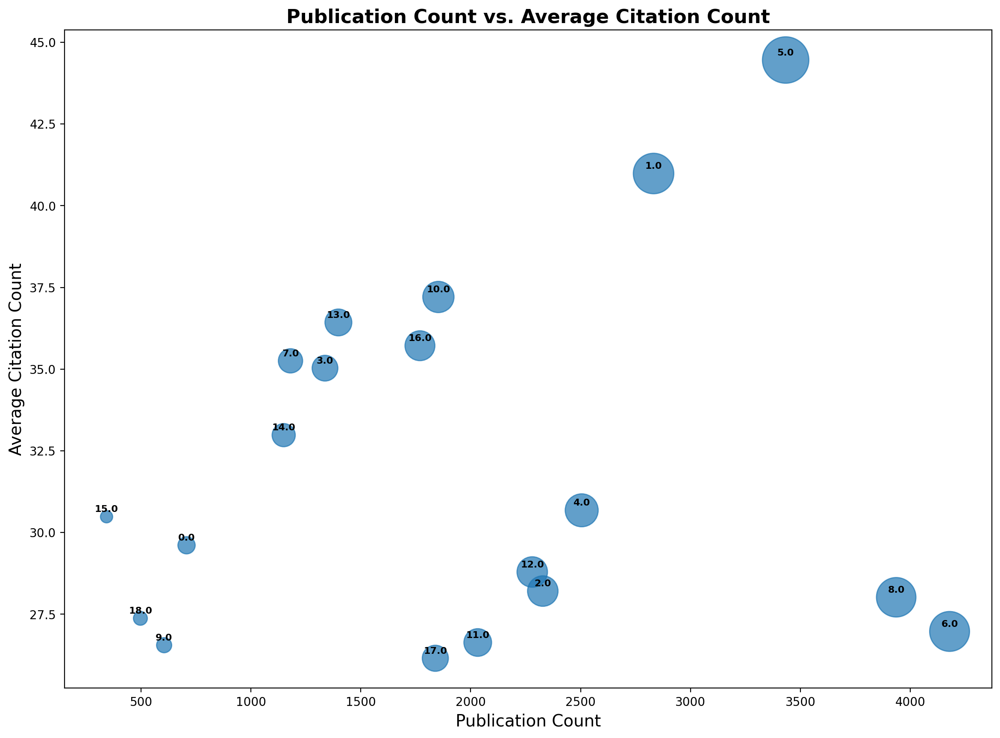

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Sample data; replace this with your DataFrame
# df = pd.read_csv('your_data.csv')

# Filter the data to only include rows where 'Publication Count' is greater than 9
#df_filtered = grouped[grouped['Publication Count'] > 6]

# Create a color map based on the 'Region' column
#colors = grouped['Region'].apply(lambda x: 'green' if x == 'Global South' else 'blue')

# Create a new figure
plt.figure(figsize=(14, 10))

# Create the scatter plot
sc = plt.scatter(grouped['Publication Count'], grouped['Average Citation Count'],
                 #c=colors,  # Use the colors we mapped
                 s=grouped['Total Citation'] / 100,  # Adjust the scaling factor
                 alpha=0.7,
                 #label='Countries'
                 )

# Add titles and labels with bold text
plt.title('Publication Count vs. Average Citation Count', fontweight='bold', fontsize=16)
plt.xlabel('Publication Count', fontsize=14) #fontweight='bold',
plt.ylabel('Average Citation Count', fontsize=14) #fontweight='bold',

# Label some of the significant countries or outliers
for i, row in grouped.iterrows():
    if row['Publication Count'] > 10 or row['Average Citation Count'] > 10:  # You can set your own conditions
        plt.annotate(row['Topic'], (row['Publication Count'], row['Average Citation Count']),
                     textcoords="offset points", xytext=(0,4), ha='center', fontsize=8, fontweight='bold')#, fontweight='bold')

# Add a legend manually to represent Global North and South
#plt.scatter([], [], c='green', alpha=0.7, s=100, label='Global South')
#plt.scatter([], [], c='blue', alpha=0.7, s=100, label='Global North')
#plt.legend(loc='upper center', title='Region', fontsize=9)

# Save the figure
plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_Scatter_Plot_Publication_vs_Avg_Citation.png", dpi=600)

# Show the plot
plt.show()


In [ ]:
# Create a new column, 'Year Group', to indicate which 5-year group each row belongs to
topics_data_citation['Year Group'] = pd.cut(topics_data_citation['Publication Year'], bins=range(2003, 2025, 5), right=False)


topics_data_citation

,Publication Year,Topic N°,"Times Cited, All Databases",Year Group
wos_ID,,,,
wos:000183215700003,2003,6,19,"[2003.0, 2008.0)"
wos:000180955900018,2003,11,114,"[2003.0, 2008.0)"
wos:000183683300008,2003,11,2,"[2003.0, 2008.0)"
wos:000184760800009,2003,12,26,"[2003.0, 2008.0)"
wos:000187153000005,2003,13,14,"[2003.0, 2008.0)"
...,...,...,...,...
wos:000959867000004,2023,13,0,NaN
wos:000968835000001,2023,4,0,NaN
wos:000933339800001,2023,12,0,NaN


In [ ]:
# Now, we can drop the rows where 'Publication' is NaN (indicating no publication for that country)
#melted_df.dropna(subset=['Publication'], inplace=True)

# Now we'll group by 'Year Group' and 'Country', and calculate the count of 'Publication Year' and the sum of 'Times Cited, All Databases'
topics_data_citation_grouped = topics_data_citation.groupby(['Year Group', 'Topic N°']).agg({'Publication Year': 'count', 'Times Cited, All Databases': 'sum'}).reset_index()
topics_data_citation_grouped['Average Citation Count'] = topics_data_citation_grouped['Times Cited, All Databases']/topics_data_citation_grouped['Publication Year']

# Rename columns
topics_data_citation_grouped.columns = ['Year Group', 'Topic N°', 'Publication Count',	'Total Citation', 'Average Citation Count']

topics_data_citation_grouped

,Year Group,Topic N°,Publication Count,Total Citation,Average Citation Count
0,"[2003, 2008)",0,224,7591,33.888393
1,"[2003, 2008)",1,236,24426,103.500000
2,"[2003, 2008)",2,592,26768,45.216216
3,"[2003, 2008)",3,448,18105,40.412946
4,"[2003, 2008)",4,328,20471,62.411585
...,...,...,...,...,...
71,"[2018, 2023)",14,491,7987,16.266802
72,"[2018, 2023)",15,119,2177,18.294118
73,"[2018, 2023)",16,462,5346,11.571429
74,"[2018, 2023)",17,669,6092,9.106129


In [ ]:
# Pivot the DataFrame
topics_data_citation_grouped_pivot_df = topics_data_citation_grouped.pivot(index='Topic N°', columns='Year Group', values=['Publication Count',	'Total Citation', 'Average Citation Count'])

# Fill NaN values with 0
#pivot_df.fillna(0, inplace=True)
# Save data
topics_data_citation_grouped_pivot_df.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_list_count_citation_group_year.pkl')
topics_data_citation_grouped_pivot_df.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_list_count_citation_group_year.csv')

# Print the pivoted DataFrame
# Replace NaN values with 0 in-place
topics_data_citation_grouped_pivot_df.fillna(0)


Publication Count                                         \
Year Group      [2003, 2008) [2008, 2013) [2013, 2018) [2018, 2023)   
Topic N°                                                              
0                      224.0        171.0        162.0        138.0   
1                      236.0        462.0        752.0       1217.0   
2                      592.0        632.0        579.0        480.0   
3                      448.0        342.0        304.0        216.0   
4                      328.0        526.0        685.0        860.0   
5                      535.0        660.0        854.0       1267.0   
6                     1034.0       1002.0       1075.0        980.0   
7                      370.0        290.0        250.0        253.0   
8                      469.0        591.0        927.0       1722.0   
9                      206.0        195.0        130.0         71.0   
10                     316.0        412.0        468.0        557.0   
11                     694.0        549.0        429.0        339.0   
12                     370.0        516.0        585.0        733.0   
13                     335.0        408.0        377.0        262.0   
14                     121.0        200.0        283.0        491.0   
15                      73.0         69.0         57.0        119.0   
16                     403.0        402.0        446.0        462.0   
17                     234.0        391.0        463.0        669.0   
18                     166.0        128.0        106.0         94.0   

           Total Citation                                         \
Year Group   [2003, 2008) [2008, 2013) [2013, 2018) [2018, 2023)   
Topic N°                                                           
0                  7591.0       6244.0       5773.0       1324.0   
1                 24426.0      28932.0      40022.0      22641.0   
2                 26768.0      22185.0      12536.0       4174.0   
3                 18105.0      12587.0      11060.0       5078.0   
4                 20471.0      26138.0      20731.0       9488.0   
5                 51544.0      57237.0      29896.0      13930.0   
6                 45688.0      36000.0      22039.0       8982.0   
7                 20625.0      10566.0       7021.0       3375.0   
8                 29151.0      27561.0      31659.0      21799.0   
9                  8537.0       4673.0       2256.0        598.0   
10                22876.0      22601.0      15506.0       7907.0   
11                26353.0      16567.0       8491.0       2710.0   
12                20608.0      20271.0      15600.0       9148.0   
13                20281.0      16949.0      10799.0       2891.0   
14                 8106.0      10102.0      11688.0       7987.0   
15                 3648.0       2409.0       2199.0       2177.0   
16                24801.0      19608.0      13402.0       5346.0   
17                14337.0      14337.0      13315.0       6092.0   
18                 7134.0       3674.0       2062.0        736.0   

           Average Citation Count                                         
Year Group           [2003, 2008) [2008, 2013) [2013, 2018) [2018, 2023)  
Topic N°                                                                  
0                       33.888393    36.514620    35.635802     9.594203  
1                      103.500000    62.623377    53.220745    18.603944  
2                       45.216216    35.102848    21.651123     8.695833  
3                       40.412946    36.804094    36.381579    23.509259  
4                       62.411585    49.692015    30.264234    11.032558  
5                       96.343925    86.722727    35.007026    10.994475  
6                       44.185687    35.928144    20.501395     9.165306  
7                       55.743243    36.434483    28.084000    13.339921  
8                       62.155650    46.634518    34.152104    12.659117  
9                       41.441748    23.964103    1

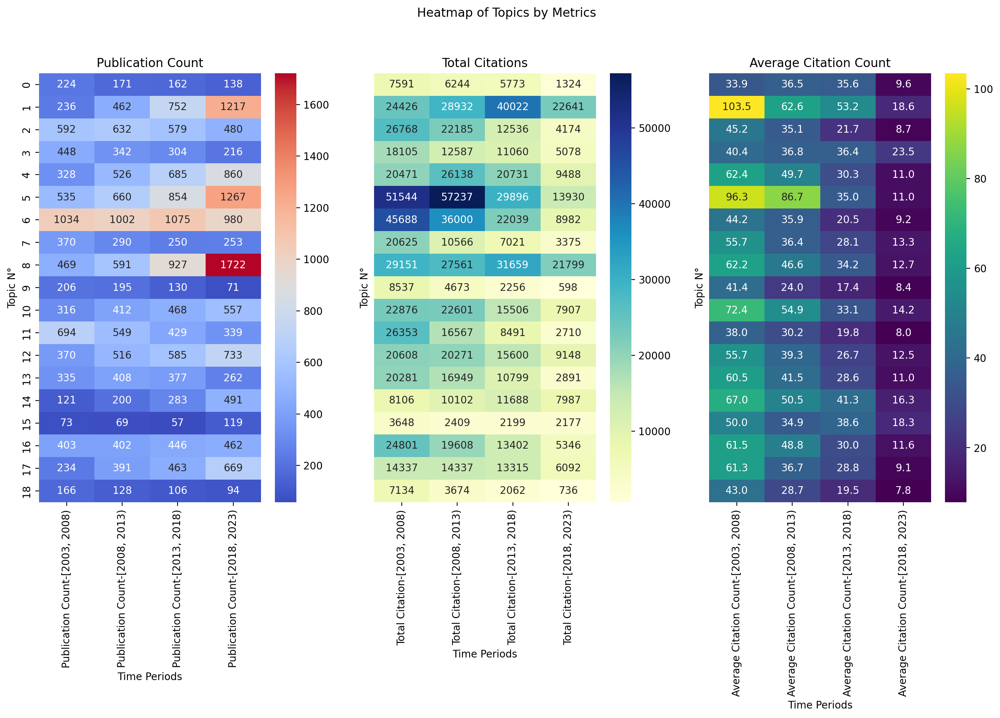

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data. Replace this with your actual DataFrame.
df = topics_data_citation_grouped_pivot_df

# Ensure that DataFrames are not empty
assert not df.empty, "Main DataFrame is empty!"

# Filter DataFrame based on column names
publication_columns = [col for col in df.columns if 'Publication Count' in col]
total_citations_columns = [col for col in df.columns if 'Total Citation' in col]
average_citation_count_columns = [col for col in df.columns if 'Average Citation Count' in col]

# Assertions to check if any DataFrame is empty
assert publication_columns, "No columns matched for 'Publication Count'"
assert total_citations_columns, "No columns matched for 'Total Citation'"
assert average_citation_count_columns, "No columns matched for 'Average Citation Count'"

publication_df = df[publication_columns]
total_citations_df = df[total_citations_columns]
average_citation_count_df = df[average_citation_count_columns]

# Generate subplots
fig, axes = plt.subplots(1, 3, figsize=(14, 10))

# Create the heatmaps
sns.heatmap(publication_df, annot=True, cmap="coolwarm", fmt=".0f", ax=axes[0], yticklabels=True)
axes[0].set_title('Publication Count')

sns.heatmap(total_citations_df, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[1], yticklabels=False)
axes[1].set_title('Total Citations')

sns.heatmap(average_citation_count_df, annot=True, cmap="viridis", fmt=".1f", ax=axes[2], yticklabels=False)
axes[2].set_title('Average Citation Count')

# Common settings
axes[0].set_ylabel('Topic N°')
for ax in axes:
    ax.set_xlabel('Time Periods')

# Super title for all subplots
plt.suptitle('Heatmap of Topics by Metrics')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Heatmap of TOPICs by Metrics.png", dpi=600)
plt.show()


In [ ]:
# Convert all levels of multi-index columns to strings
df.columns = df.columns.map(lambda x: tuple(map(str, x)))
# Check the new column names
#df

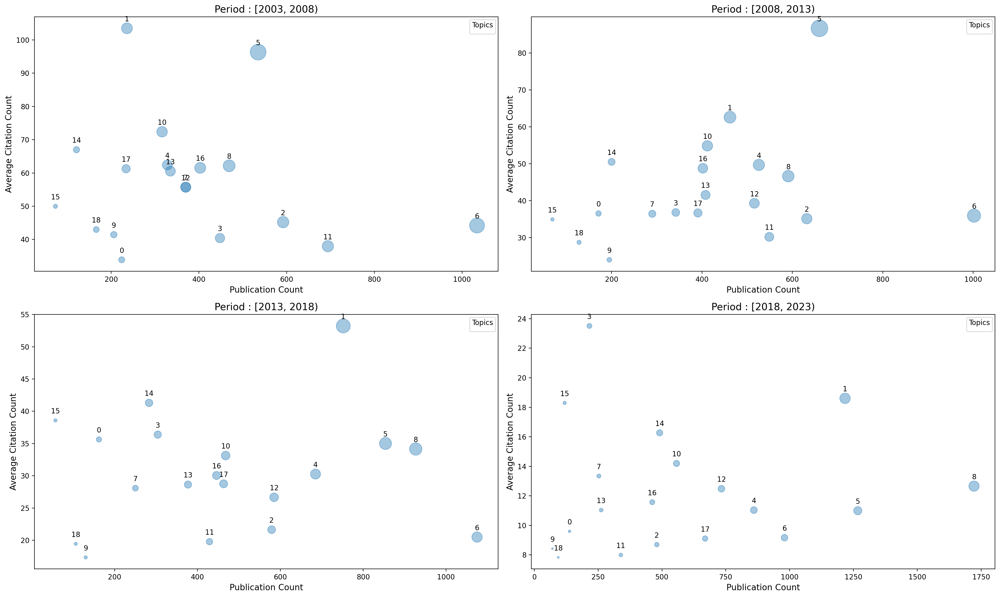

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import math

# Assume df is your DataFrame

time_periods = ['[2003, 2008)', '[2008, 2013)', '[2013, 2018)', '[2018, 2023)']
#color_map = {'Global North': 'blue', 'Global South': 'green'}

# Initialize subplot
fig, axes = plt.subplots(math.ceil(len(time_periods) / 2), 2, figsize=(20, 12))
axes = axes.flatten()

for idx, period in enumerate(time_periods):
    ax = axes[idx]

    # Limit y-axis to 100 only for the period '[2013, 2018)'
    #if period == '[2013, 2018)':
        #ax.set_ylim([0, 52])

    #for region, color in color_map.items():
        #subset = df[df['Region'] == region]
        # Filter countries with less than 2 publications
    #subset = subset[subset[('Publication Count', period)] >= 5]

    x_data = df[('Publication Count', period)]
    y_data = df[('Average Citation Count', period)]
    size_data = df[('Total Citation', period)] / 100  # Scale the size data

    ax.scatter(x_data, y_data, s=size_data, alpha=0.4)

    ax.set_title(f"Period : {period}", fontsize=14)
    ax.set_xlabel("Publication Count", fontsize=12)
    ax.set_ylabel("Average Citation Count", fontsize=12)

    # Limit the y-axis (Average Citation Count) to 100
    #ax.set_ylim(0, 100)

    # Adding a legend
    ax.legend(title='Topics', fontsize=8)

    for i, txt in enumerate(df.index):
        x = df.loc[i, ('Publication Count', period)]
        y = df.loc[i, ('Average Citation Count', period)]
        if x >= 4:  # Only annotate if there are at least 2 publications
            ax.annotate(txt, (x, y), textcoords="offset points", xytext=(0,10), ha='center', fontsize=10)

# Remove any extra subplots
for idx in range(len(time_periods), len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_Scatter_Plot_Publication_vs_Avg_Citation_period.png", dpi=600)
plt.show()


HEATMAP AND CLUSTER TO GROUP THE COUNTRIES AND REGIONS, TO SEE WHO ARE MORE SIMILLAR OR CONTRIBUTED TOGHETHER

# region

## UN REGION GROUP

In [ ]:
un_region_group = ['Addresses','un_north_africa','un_eastern_africa','un_middle_africa','un_Southern_africa','un_Western_africa',
    'un_Latin_America_and_the_Caribbean','un_Northern_America',
    'un_Central_Asia','un_Eastern_Asia','un_South_eastern_Asia','un_Southern_Asia','un_Western_Asia',
    'un_Eastern_Europe','un_Northern_Europe','un_Southern_Europe','un_Western_Europe',
    'un_Australia_and_New_Zealand','un_Melanesia','un_Micronesia','un_Polynesia']

In [ ]:
#Import data
un_region_group_data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/countries_and_un_wb_region_income_all.pkl')#.reset_index()#[un_region_group]

# Only keep regions that are columns in the DataFrame
un_region_group = [region for region in un_region_group if region in un_region_group_data.columns]#

# Select columns and reset index
un_region_group_data = un_region_group_data[un_region_group].reset_index()

# Rename columns and set index
un_region_group_data = un_region_group_data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID','Publication Year'])
un_region_group_data#.head()

,,Addresses,un_north_africa,un_eastern_africa,un_middle_africa,un_Southern_africa,un_Western_africa,un_Latin_America_and_the_Caribbean,un_Northern_America,un_Central_Asia,un_Eastern_Asia,un_South_eastern_Asia,un_Southern_Asia,un_Western_Asia,un_Eastern_Europe,un_Northern_Europe,un_Southern_Europe,un_Western_Europe,un_Australia_and_New_Zealand,un_Melanesia
wos_ID,Publication Year,,,,,,,,,,,,,,,,,,,
wos:a1975ak27200035,1975,"harvard univ, med sch, dept biol chem, boston,...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:a1975bb78600005,1975,"max planck inst molek genet,abt trautner,ihne ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
wos:a1975ak49300025,1975,"stanford univ, sch med, dept biochem, stanford...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:a1975al49000001,1975,"suny, dept biochem, stony brook, ny 11794 usa;...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:a1975ay53300001,1975,"univ washington, dept genet, seattle, wa 98105...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wos:000968835000001,2023,"[lan, jinxin; wu, yao; lin, changmei; chen, ji...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:000933339800001,2023,"[hirao, rie; shigetoh, keisuke; inagaki, shinj...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wos:000914484900001,2023,"[brogna, carlo; bisaccia, domenico rocco] dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN


In [ ]:
un_region_group_data_citation = pd.concat([un_region_group_data, citation_data], axis=1).reset_index()
un_region_group_data_citation = un_region_group_data_citation[un_region_group_data_citation['Publication Year'] >= 2003]
un_region_group_data_citation#.head(2)

,wos_ID,Publication Year,Addresses,un_north_africa,un_eastern_africa,un_middle_africa,un_Southern_africa,un_Western_africa,un_Latin_America_and_the_Caribbean,un_Northern_America,...,un_South_eastern_Asia,un_Southern_Asia,un_Western_Asia,un_Eastern_Europe,un_Northern_Europe,un_Southern_Europe,un_Western_Europe,un_Australia_and_New_Zealand,un_Melanesia,"Times Cited, All Databases"
23824,wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,19.0
23825,wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, swi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,114.0
23826,wos:000183683300008,2003,"tel aviv univ, dept biochem, il-69978 tel aviv...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0
23827,wos:000184760800009,2003,"univ arizona, dept soil water & environm sci, ...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,26.0
23828,wos:000187153000005,2003,"uppsala univ, dept cell & mol biol, s-75124 up...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61539,wos:000968835000001,2023,"[lan, jinxin; wu, yao; lin, changmei; chen, ji...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
61540,wos:000933339800001,2023,"[hirao, rie; shigetoh, keisuke; inagaki, shinj...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
61541,wos:000914484900001,2023,"[brogna, carlo; bisaccia, domenico rocco] dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,5.0
61542,wos:001003139700001,2023,"[lee, l. y. y.; subbarao, k.] univ melbourne, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN


In [ ]:
# First merge
un_region_group_data_citation_merged_topic = pd.merge(un_region_group_data_citation, topics_data_citation[['Topic N°','Year Group']].reset_index(), on='wos_ID', how='outer')

un_region_group_data_citation_merged_topic#.head(60)

,wos_ID,Publication Year,Addresses,un_north_africa,un_eastern_africa,un_middle_africa,un_Southern_africa,un_Western_africa,un_Latin_America_and_the_Caribbean,un_Northern_America,...,un_Western_Asia,un_Eastern_Europe,un_Northern_Europe,un_Southern_Europe,un_Western_Europe,un_Australia_and_New_Zealand,un_Melanesia,"Times Cited, All Databases",Topic N°,Year Group
0,wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,19.0,6.0,"[2003.0, 2008.0)"
1,wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, swi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,114.0,11.0,"[2003.0, 2008.0)"
2,wos:000183683300008,2003,"tel aviv univ, dept biochem, il-69978 tel aviv...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,11.0,"[2003.0, 2008.0)"
3,wos:000184760800009,2003,"univ arizona, dept soil water & environm sci, ...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,26.0,12.0,"[2003.0, 2008.0)"
4,wos:000187153000005,2003,"uppsala univ, dept cell & mol biol, s-75124 up...",NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,14.0,13.0,"[2003.0, 2008.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37715,wos:000968835000001,2023,"[lan, jinxin; wu, yao; lin, changmei; chen, ji...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,4.0,NaN
37716,wos:000933339800001,2023,"[hirao, rie; shigetoh, keisuke; inagaki, shinj...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,12.0,NaN
37717,wos:000914484900001,2023,"[brogna, carlo; bisaccia, domenico rocco] dept...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,NaN,NaN,5.0,15.0,NaN
37718,wos:001003139700001,2023,"[lee, l. y. y.; subbarao, k.] univ melbourne, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [ ]:
# Reset the index to make 'Publication Year' a regular column
un_region_group_data2 = un_region_group_data_citation_merged_topic.copy()

# Drop unnecessary columns
un_region_group_data2.drop(['wos_ID', 'Publication Year', 'Addresses','Times Cited, All Databases'], axis=1, inplace=True)
un_region_group_data2

,un_north_africa,un_eastern_africa,un_middle_africa,un_Southern_africa,un_Western_africa,un_Latin_America_and_the_Caribbean,un_Northern_America,un_Central_Asia,un_Eastern_Asia,un_South_eastern_Asia,un_Southern_Asia,un_Western_Asia,un_Eastern_Europe,un_Northern_Europe,un_Southern_Europe,un_Western_Europe,un_Australia_and_New_Zealand,un_Melanesia,Topic N°,Year Group
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,6.0,"[2003.0, 2008.0)"
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,11.0,"[2003.0, 2008.0)"
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,11.0,"[2003.0, 2008.0)"
3,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,12.0,"[2003.0, 2008.0)"
4,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,13.0,"[2003.0, 2008.0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37715,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN
37716,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,NaN
37717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,15.0,NaN
37718,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


In [ ]:
# Drop the 'Times Cited, All Databases' column as it doesn't seem necessary for the spider chart
df = un_region_group_data2

# Pre-processing
grouped = df.groupby(['Topic N°', 'Year Group']).count()#.reset_index()

# Sum all values for each column to get the total count for each region
column_sums = grouped.sum()

# Sort the columns based on their counts
sorted_columns = column_sums.sort_values(ascending=False).index.tolist()

# Reorder the dataframe columns based on the sorted columns
sorted_df = grouped[sorted_columns]

sorted_df

un_Northern_America  un_Eastern_Asia  \
Topic N° Year Group                                           
0.0      [2003, 2008)                  116               17   
         [2008, 2013)                   88               22   
         [2013, 2018)                   93               21   
         [2018, 2023)                   66               29   
1.0      [2003, 2008)                  132               16   
...                                    ...              ...   
17.0     [2018, 2023)                  162              261   
18.0     [2003, 2008)                  116                4   
         [2008, 2013)                   79               11   
         [2013, 2018)                   52               21   
         [2018, 2023)                   41               23   

                       un_Western_Europe  un_Northern_Europe  \
Topic N° Year Group                                            
0.0      [2003, 2008)                 45                  30   
         [2008, 2013)                 29                  20   
         [2013, 2018)                 33                  26   
         [2018, 2023)                 22                  16   
1.0      [2003, 2008)                 41                  44   
...                                  ...                 ...   
17.0     [2018, 2023)                119                  99   
18.0     [2003, 2008)                 41                  17   
         [2008, 2013)                 17                  18   
         [2013, 2018)                 23                  11   
         [2018, 2023)                 17                  16   

                       un_Southern_Europe  un_Eastern_Europe  \
Topic N° Year Group                                            
0.0      [2003, 2008)                  21                 22   
         [2008, 2013)                   9                 22   
         [2013, 2018)                   8                 21   
         [2018, 2023)                   8                 19   
1.0      [2003, 2008)                   9                  7   
...                                   ...                ...   
17.0     [2018, 2023)                  41                 69   
18.0     [2003, 2008)                   4                  9   
         [2008, 2013)                  10                  6   
         [2013, 2018)                   6                  9   
         [2018, 2023)                   3                 11   

                       un_Southern_Asia  un_Australia_and_New_Zealand  \
Topic N° Year Group                                                     
0.0      [2003, 2008)                 7                             3   
         [2008, 2013)                11                             5   
         [2013, 2018)                 2                             4   
         [2018, 2023)                 8                             9   
1.0      [2003, 2008)                 4                            12   
...                                 ...                           ...   
17.0     [2018, 2023)                43                            29   
18.0     [2003, 2008)                 1                             3   
         [2008, 2013)                 4                             2   
         [2013, 2018)                 4                             3   
         [2018, 2023)                 5                             3   

                       un_Western_Asia  un_South_eastern_Asia  \
Topic N° Year Group                                             
0.0      [2003, 2008)                7                      0   
         [2008, 2013)                1                      0   
         [2013, 2018)                3                      0   
         [2018, 2023)                7                      1   
1.0      [2003, 2008)                7                      3   
...                                ...                    ...   
17.0     [2018, 2023)               18                     40   
18

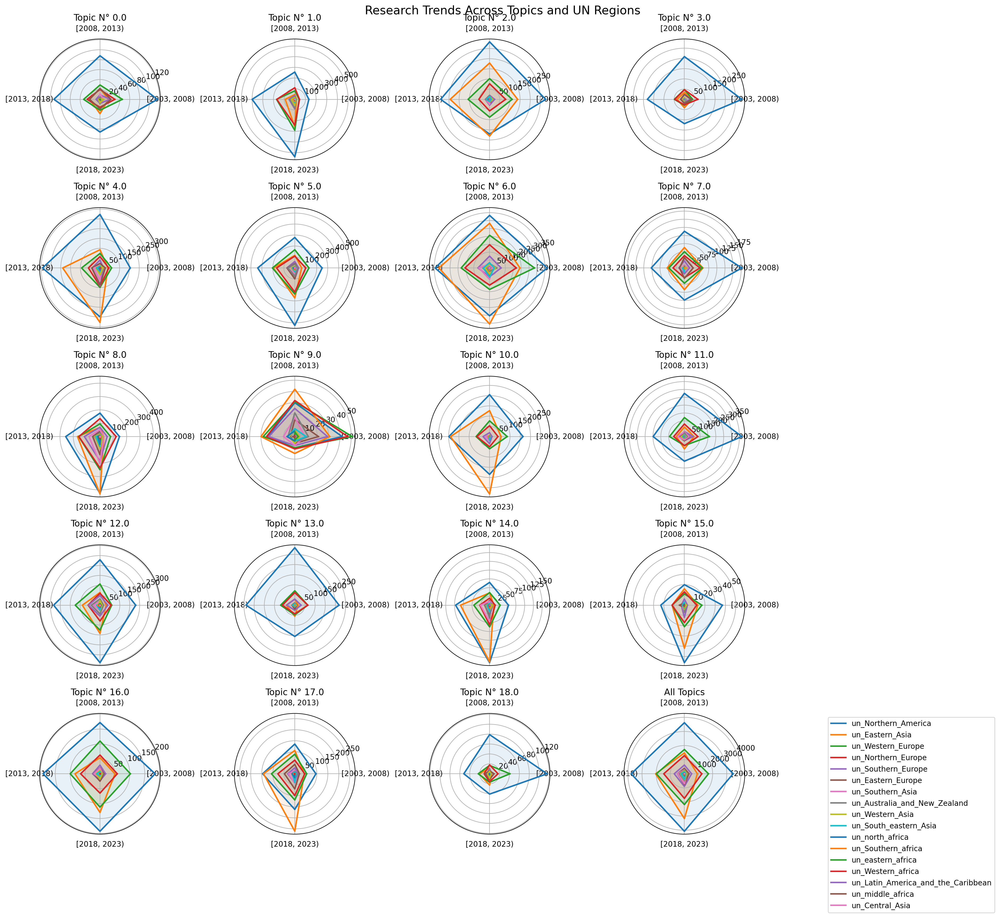

In [ ]:
# Pre-processing
grouped = sorted_df.reset_index()

# Extract year groups and regions
year_groups = grouped['Year Group'].unique()
regions = grouped.columns[2:-1]  # Excluding Topic N° and Year Group

topics = grouped['Topic N°'].unique()
n_topics = len(topics)

n_rows = int(np.ceil((n_topics + 1) / 4))

fig, axes = plt.subplots(n_rows, 4, figsize=(19, n_rows * 3.5), subplot_kw=dict(polar=True))
axes_flat = axes.flatten()

# Mapping of abbreviated UN region names to full names
region_mapping = {
    'un_Australia_and_New_Zealand': 'Australia and New Zealand',
    'un_Central_Asia': 'Central Asia',
    'un_Eastern_Asia': 'Eastern Asia',
    'un_Eastern_Europe': 'Eastern Europe',
    'un_Latin_America_and_the_Caribbean': 'Latin America and the Caribbean',
    'un_Melanesia': 'Melanesia',
    'un_Northern_America': 'Northern America',
    'un_Northern_Europe': 'Northern Europe',
    'un_South_eastern_Asia': 'South-eastern Asia',
    'un_Southern_Asia': 'Southern Asia',
    'un_Southern_Europe': 'Southern Europe',
    'un_Southern_africa': 'Southern Africa',
    'un_Western_Asia': 'Western Asia',
    'un_Western_Europe': 'Western Europe',
    'un_Western_africa': 'Western Africa',
    'un_eastern_africa': 'Eastern Africa',
    'un_middle_africa': 'Middle Africa',
    'un_north_africa': 'North Africa'
}

# Set a global title
fig.suptitle('Research Trends Across Topics and UN Regions', fontsize=16)


# Create a radar chart for each topic
for idx, topic in enumerate(topics):
    ax = axes_flat[idx]
    topic_data = grouped[grouped['Topic N°'] == topic]

    for region in regions:
        values = topic_data[region].tolist()
        values += values[:1]  # close the loop in radar chart

        angles = [n / float(len(year_groups)) * 2 * np.pi for n in range(len(year_groups))]
        angles += angles[:1]

        ax.plot(angles, values, linewidth=2, label=region)
        ax.fill(angles, values, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(year_groups)
    ax.set_title(f'Topic N° {topic}')
    #ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1))

# Radar chart for all topics
ax_all = axes_flat[n_topics]
grouped_all = df.groupby(['Year Group']).sum().reset_index()
for region in regions:
    values = grouped_all[region].tolist()
    values += values[:1]  # close the loop in radar chart

    angles = [n / float(len(year_groups)) * 2 * np.pi for n in range(len(year_groups))]
    angles += angles[:1]

    ax_all.plot(angles, values, linewidth=2, label=region)
    ax_all.fill(angles, values, alpha=0.1)

ax_all.set_xticks(angles[:-1])
ax_all.set_xticklabels(year_groups)
ax_all.set_title(f'All Topics')
ax_all.legend(loc='upper right', bbox_to_anchor=(3.1, 1))

# Removing any unused subplots
for i in range(n_topics + 1, n_rows * 4):
    fig.delaxes(axes_flat[i])

# Legend for the entire figure
#fig.legend(loc='upper right', bbox_to_anchor=(2.2, 1), labels=regions)

# Adjusting the layout to fit better
fig.tight_layout()

plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_Radar_charts_UN Regions_across_periods.png", dpi=600)
plt.show()


## WB REGION GROUP

In [ ]:
wb_region_group = ['Addresses','wb_east_asia_and_pacific', 'wb_europe_and_central_asia', 'wb_latin_america_and_the_caribbean', 'wb_middle_east_and_north_africa', 'wb_north_america', 'wb_south_asia', 'wb_sub_saharan_africa',
]

In [ ]:
#Import data
wb_region_group_data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/countries_and_un_wb_region_income_all.pkl')#.reset_index()#[un_region_group]

# Only keep regions that are columns in the DataFrame
wb_region_group = [region for region in wb_region_group if region in wb_region_group_data.columns]#

# Select columns and reset index
wb_region_group_data = wb_region_group_data[wb_region_group].reset_index()

# Rename columns and set index
wb_region_group_data = wb_region_group_data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID','Publication Year'])
wb_region_group_data#.head()

,,Addresses,wb_east_asia_and_pacific,wb_europe_and_central_asia,wb_latin_america_and_the_caribbean,wb_middle_east_and_north_africa,wb_north_america,wb_south_asia,wb_sub_saharan_africa
wos_ID,Publication Year,,,,,,,,
wos:a1975ak27200035,1975,"harvard univ, med sch, dept biol chem, boston,...",NaN,NaN,NaN,NaN,1.0,NaN,NaN
wos:a1975bb78600005,1975,"max planck inst molek genet,abt trautner,ihne ...",NaN,1.0,NaN,NaN,NaN,NaN,NaN
wos:a1975ak49300025,1975,"stanford univ, sch med, dept biochem, stanford...",NaN,NaN,NaN,NaN,1.0,NaN,NaN
wos:a1975al49000001,1975,"suny, dept biochem, stony brook, ny 11794 usa;...",NaN,NaN,NaN,NaN,1.0,NaN,NaN
wos:a1975ay53300001,1975,"univ washington, dept genet, seattle, wa 98105...",NaN,NaN,NaN,NaN,1.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
wos:000968835000001,2023,"[lan, jinxin; wu, yao; lin, changmei; chen, ji...",1.0,NaN,NaN,NaN,NaN,NaN,NaN
wos:000933339800001,2023,"[hirao, rie; shigetoh, keisuke; inagaki, shinj...",1.0,NaN,NaN,NaN,NaN,NaN,NaN
wos:000914484900001,2023,"[brogna, carlo; bisaccia, domenico rocco] dept...",NaN,2.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
wb_region_group_data_citation = pd.concat([wb_region_group_data, citation_data], axis=1).reset_index()
wb_region_group_data_citation = wb_region_group_data_citation[wb_region_group_data_citation['Publication Year'] >= 2003]

wb_region_group_data_citation#.head(2)

,wos_ID,Publication Year,Addresses,wb_east_asia_and_pacific,wb_europe_and_central_asia,wb_latin_america_and_the_caribbean,wb_middle_east_and_north_africa,wb_north_america,wb_south_asia,wb_sub_saharan_africa,"Times Cited, All Databases"
23824,wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept...",NaN,1.0,NaN,NaN,NaN,NaN,NaN,19.0
23825,wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, swi...",NaN,1.0,NaN,NaN,NaN,NaN,NaN,114.0
23826,wos:000183683300008,2003,"tel aviv univ, dept biochem, il-69978 tel aviv...",NaN,NaN,NaN,2.0,NaN,NaN,NaN,2.0
23827,wos:000184760800009,2003,"univ arizona, dept soil water & environm sci, ...",NaN,NaN,NaN,2.0,1.0,NaN,NaN,26.0
23828,wos:000187153000005,2003,"uppsala univ, dept cell & mol biol, s-75124 up...",NaN,1.0,NaN,NaN,1.0,NaN,NaN,14.0
...,...,...,...,...,...,...,...,...,...,...,...
61539,wos:000968835000001,2023,"[lan, jinxin; wu, yao; lin, changmei; chen, ji...",1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
61540,wos:000933339800001,2023,"[hirao, rie; shigetoh, keisuke; inagaki, shinj...",1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0
61541,wos:000914484900001,2023,"[brogna, carlo; bisaccia, domenico rocco] dept...",NaN,2.0,NaN,NaN,NaN,NaN,NaN,5.0
61542,wos:001003139700001,2023,"[lee, l. y. y.; subbarao, k.] univ melbourne, ...",1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# First merge
wb_region_group_data_citation_merged_topic = pd.merge(wb_region_group_data_citation, topics_data_citation[['Topic N°','Year Group']].reset_index(), on='wos_ID', how='outer')
wb_region_group_data_citation_merged_topic.head()

,wos_ID,Publication Year,Addresses,wb_east_asia_and_pacific,wb_europe_and_central_asia,wb_latin_america_and_the_caribbean,wb_middle_east_and_north_africa,wb_north_america,wb_south_asia,wb_sub_saharan_africa,"Times Cited, All Databases",Topic N°,Year Group
0,wos:000183215700003,2003,"univ malaga, fac ciencias, lab quim prot, dept...",NaN,1.0,NaN,NaN,NaN,NaN,NaN,19.0,6.0,"[2003, 2008)"
1,wos:000180955900018,2003,"univ zurich, inst biochem, ch-8057 zurich, swi...",NaN,1.0,NaN,NaN,NaN,NaN,NaN,114.0,11.0,"[2003, 2008)"
2,wos:000183683300008,2003,"tel aviv univ, dept biochem, il-69978 tel aviv...",NaN,NaN,NaN,2.0,NaN,NaN,NaN,2.0,11.0,"[2003, 2008)"
3,wos:000184760800009,2003,"univ arizona, dept soil water & environm sci, ...",NaN,NaN,NaN,2.0,1.0,NaN,NaN,26.0,12.0,"[2003, 2008)"
4,wos:000187153000005,2003,"uppsala univ, dept cell & mol biol, s-75124 up...",NaN,1.0,NaN,NaN,1.0,NaN,NaN,14.0,13.0,"[2003, 2008)"


In [ ]:
# Reset the index to make 'Publication Year' a regular column
wb_region_group_data2 = wb_region_group_data_citation_merged_topic.copy()

# Drop unnecessary columns
wb_region_group_data2.drop(['wos_ID', 'Publication Year', 'Addresses','Times Cited, All Databases'], axis=1, inplace=True)
wb_region_group_data2

,wb_east_asia_and_pacific,wb_europe_and_central_asia,wb_latin_america_and_the_caribbean,wb_middle_east_and_north_africa,wb_north_america,wb_south_asia,wb_sub_saharan_africa,Topic N°,Year Group
0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,6.0,"[2003.0, 2008.0)"
1,NaN,1.0,NaN,NaN,NaN,NaN,NaN,11.0,"[2003.0, 2008.0)"
2,NaN,NaN,NaN,2.0,NaN,NaN,NaN,11.0,"[2003.0, 2008.0)"
3,NaN,NaN,NaN,2.0,1.0,NaN,NaN,12.0,"[2003.0, 2008.0)"
4,NaN,1.0,NaN,NaN,1.0,NaN,NaN,13.0,"[2003.0, 2008.0)"
...,...,...,...,...,...,...,...,...,...
37715,1.0,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN
37716,1.0,NaN,NaN,NaN,NaN,NaN,NaN,12.0,NaN
37717,NaN,2.0,NaN,NaN,NaN,NaN,NaN,15.0,NaN
37718,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Drop the 'Times Cited, All Databases' column as it doesn't seem necessary for the spider chart
df = wb_region_group_data2

# Pre-processing
grouped = df.groupby(['Topic N°', 'Year Group']).count()#.reset_index()

# Sum all values for each column to get the total count for each region
column_sums = grouped.sum()

# Sort the columns based on their counts
sorted_columns = column_sums.sort_values(ascending=False).index.tolist()

# Reorder the dataframe columns based on the sorted columns
sorted_df = grouped[sorted_columns]

sorted_df

wb_north_america  wb_europe_and_central_asia  \
Topic N° Year Group                                                   
0.0      [2003, 2008)               116                         107   
         [2008, 2013)                88                          66   
         [2013, 2018)                93                          70   
         [2018, 2023)                66                          55   
1.0      [2003, 2008)               132                          90   
...                                 ...                         ...   
17.0     [2018, 2023)               162                         265   
18.0     [2003, 2008)               116                          60   
         [2008, 2013)                79                          46   
         [2013, 2018)                52                          37   
         [2018, 2023)                41                          37   

                       wb_east_asia_and_pacific  \
Topic N° Year Group                               
0.0      [2003, 2008)                        20   
         [2008, 2013)                        27   
         [2013, 2018)                        25   
         [2018, 2023)                        38   
1.0      [2003, 2008)                        31   
...                                         ...   
17.0     [2018, 2023)                       305   
18.0     [2003, 2008)                         7   
         [2008, 2013)                        13   
         [2013, 2018)                        23   
         [2018, 2023)                        26   

                       wb_middle_east_and_north_africa  \
Topic N° Year Group                                      
0.0      [2003, 2008)                                6   
         [2008, 2013)                                1   
         [2013, 2018)                                3   
         [2018, 2023)                                7   
1.0      [2003, 2008)                                6   
...                                                ...   
17.0     [2018, 2023)                               33   
18.0     [2003, 2008)                                0   
         [2008, 2013)                                5   
         [2013, 2018)                                4   
         [2018, 2023)                               11   

                       wb_latin_america_and_the_caribbean  wb_south_asia  \
Topic N° Year Group                                                        
0.0      [2003, 2008)                                   1              7   
         [2008, 2013)                                   4             11   
         [2013, 2018)                                   1              2   
         [2018, 2023)                                   0              8   
1.0      [2003, 2008)                                   1              4   
...                                                   ...            ...   
17.0     [2018, 2023)                                  19             38   
18.0     [2003, 2008)                                   3              1   
         [2008, 2013)                                   0              4   
         [2013, 2018)                                   1              4   
         [2018, 2023)                                   0              5   

                       wb_sub_saharan_africa  
Topic N° Year Group                           
0.0      [2003, 2008)                      0  
         [2008, 2013)                      1  
         [2013, 2018)                      2  
         [2018, 2023)                      1  
1.0      [2003, 2008)                      0  
...                                      ...  
17.0     [2018, 2023)                      9  
18.0     [2003, 2008)                      0  
         [2008, 2013)                      0  
         [2013, 2018)                      0  
         [2018, 2023)                      0  

[76 rows x 7 columns]

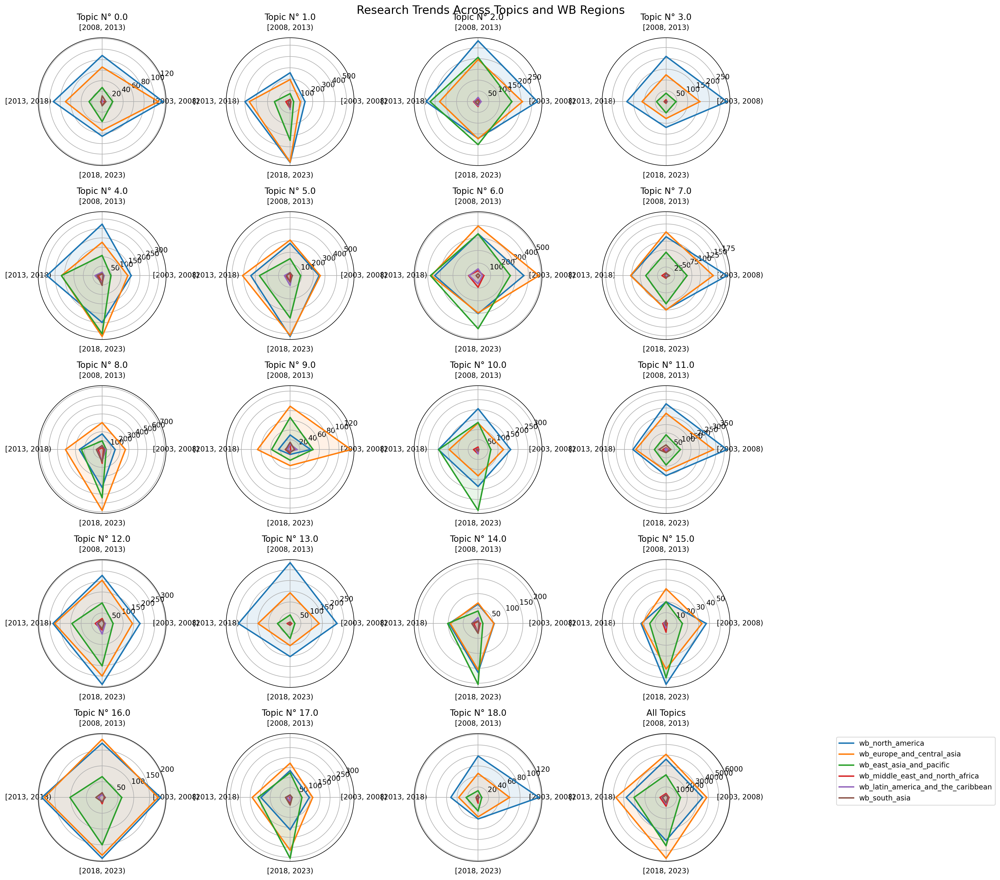

In [ ]:
# Pre-processing
grouped = sorted_df.reset_index()

# Extract year groups and regions
year_groups = grouped['Year Group'].unique()
regions = grouped.columns[2:-1]  # Excluding Topic N° and Year Group

topics = grouped['Topic N°'].unique()
n_topics = len(topics)

n_rows = int(np.ceil((n_topics + 1) / 4))

fig, axes = plt.subplots(n_rows, 4, figsize=(19, n_rows * 3.5), subplot_kw=dict(polar=True))
axes_flat = axes.flatten()

# Mapping of abbreviated UN region names to full names
region_mapping = {
    'un_Australia_and_New_Zealand': 'Australia and New Zealand',
    'un_Central_Asia': 'Central Asia',
    'un_Eastern_Asia': 'Eastern Asia',
    'un_Eastern_Europe': 'Eastern Europe',
    'un_Latin_America_and_the_Caribbean': 'Latin America and the Caribbean',
    'un_Melanesia': 'Melanesia',
    'un_Northern_America': 'Northern America',
    'un_Northern_Europe': 'Northern Europe',
    'un_South_eastern_Asia': 'South-eastern Asia',
    'un_Southern_Asia': 'Southern Asia',
    'un_Southern_Europe': 'Southern Europe',
    'un_Southern_africa': 'Southern Africa',
    'un_Western_Asia': 'Western Asia',
    'un_Western_Europe': 'Western Europe',
    'un_Western_africa': 'Western Africa',
    'un_eastern_africa': 'Eastern Africa',
    'un_middle_africa': 'Middle Africa',
    'un_north_africa': 'North Africa'
}

# Set a global title
fig.suptitle('Research Trends Across Topics and WB Regions', fontsize=16)


# Create a radar chart for each topic
for idx, topic in enumerate(topics):
    ax = axes_flat[idx]
    topic_data = grouped[grouped['Topic N°'] == topic]

    for region in regions:
        values = topic_data[region].tolist()
        values += values[:1]  # close the loop in radar chart

        angles = [n / float(len(year_groups)) * 2 * np.pi for n in range(len(year_groups))]
        angles += angles[:1]

        ax.plot(angles, values, linewidth=2, label=region)
        ax.fill(angles, values, alpha=0.1)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(year_groups)
    ax.set_title(f'Topic N° {topic}')
    #ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1))

# Radar chart for all topics
ax_all = axes_flat[n_topics]
grouped_all = df.groupby(['Year Group']).sum().reset_index()
for region in regions:
    values = grouped_all[region].tolist()
    values += values[:1]  # close the loop in radar chart

    angles = [n / float(len(year_groups)) * 2 * np.pi for n in range(len(year_groups))]
    angles += angles[:1]

    ax_all.plot(angles, values, linewidth=2, label=region)
    ax_all.fill(angles, values, alpha=0.1)

ax_all.set_xticks(angles[:-1])
ax_all.set_xticklabels(year_groups)
ax_all.set_title(f'All Topics')
ax_all.legend(loc='upper right', bbox_to_anchor=(3.1, 1))

# Removing any unused subplots
for i in range(n_topics + 1, n_rows * 4):
    fig.delaxes(axes_flat[i])

# Legend for the entire figure
#fig.legend(loc='upper right', bbox_to_anchor=(2.2, 1), labels=regions)

# Adjusting the layout to fit better
fig.tight_layout()

plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_Radar_charts_WB Regions_across_periods.png", dpi=600)
plt.show()


# income

In [ ]:
income = ['Addresses','wb_low_income_economies', 'wb_lower_middle_income_economies', 'wb_upper_middle_income_economies', 'wb_high_income_economies',
              # GLOBAL SOUTH
        'global_south', 'global_south_not_china',
              # MAIN CONTRIBUTORS COUNTRIES
          'United States','China'
                  ]

In [ ]:
#Import data
income_data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/countries_and_un_wb_region_income_all.pkl')#.reset_index()#[un_region_group]

# Only keep regions that are columns in the DataFrame
income = [elt for elt in income if elt in income_data.columns]#

# Select columns and reset index
income_data = income_data[income].reset_index()

# Rename columns and set index
income_group_data = income_data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID','Publication Year'])
#income_group_data#.head()

In [ ]:
#country_data_with_Global_North[['Addresses','Global North','Global North Without US']]

In [ ]:
income_group_data_citation = pd.concat([income_group_data,
                                        country_data_with_Global_North[['Global North','Global North Without US']],
                                        citation_data], axis=1).reset_index()
income_group_data_citation = income_group_data_citation[income_group_data_citation['Publication Year'] >= 2003]
#income_group_data_citation#.head(2)

In [ ]:
# Initialize dictionaries to hold counts and citations for each country
publication_counts = {}
citation_sums = {}
citation_means = {}

# Iterate over each column (each representing a country) except the last one which is 'Times Cited, All Databases'
for column in income_group_data_citation.columns[:-1]:
    publication_counts[column] = income_group_data_citation[column].count()  # Number of non-NaN entries is the number of publications
    citation_sums[column] = income_group_data_citation[income_group_data_citation[column].notnull()]['Times Cited, All Databases'].sum()  # Sum of 'Times Cited, All Databases' where the country column is not NaN
    citation_means[column] = income_group_data_citation[income_group_data_citation[column].notnull()]['Times Cited, All Databases'].mean()  # Mean of 'Times Cited, All Databases' where the country column is not NaN

# Convert the dictionaries to DataFrames for better visualization
publication_counts_df = pd.DataFrame(list(publication_counts.items()), columns=['income', 'Publication Count'])
citation_sums_df = pd.DataFrame(list(citation_sums.items()), columns=['income', 'Total Citation'])
citation_means_df = pd.DataFrame(list(citation_means.items()), columns=['income', 'Average Citation Count'])


# First merge
merged_df = pd.merge(publication_counts_df, citation_sums_df, on='income', how='outer')

# Now, merge the third dataframe
final_merged_df = pd.merge(merged_df, citation_means_df, on='income', how='outer')

final_merged_df['%'] = final_merged_df['Publication Count']/final_merged_df.set_index('income')['Publication Count']['Addresses']*100

# #save data
final_merged_df.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/income_count_citation_list.csv')

final_merged_df#.head(60)

,income,Publication Count,Total Citation,Average Citation Count,%
0,wos_ID,37720,1172562.0,32.389426,100.199230
1,Publication Year,37720,1172562.0,32.389426,100.199230
2,Addresses,37645,1170299.0,32.371625,100.000000
3,wb_low_income_economies,87,1713.0,20.392857,0.231106
4,wb_lower_middle_income_economies,2448,41501.0,17.849892,6.502856
5,wb_upper_middle_income_economies,8245,155737.0,19.826480,21.901979
6,wb_high_income_economies,34210,1127331.0,34.240402,90.875282
7,global_south,9527,178523.0,19.587777,25.307478
8,global_south_not_china,4748,91959.0,20.273148,12.612565
9,United States,13984,588538.0,43.832427,37.147031


In [ ]:
# Reset the index to make 'Publication Year' a regular column
income_group_data2 = income_group_data_citation.reset_index()

# Create a new column, 'Year Group', to indicate which 5-year group each row belongs to
income_group_data2['Year Group'] = pd.cut(income_group_data2['Publication Year'], bins=range(2003, 2029, 5), right=False)

# Drop unnecessary columns
income_group_data2.drop(['wos_ID', 'Publication Year', 'Addresses'], axis=1, inplace=True)

# First, let's reshape the DataFrame so each row is a country-publication pair
melted_df = pd.melt(income_group_data2, id_vars=['Year Group', 'Times Cited, All Databases'], var_name='income', value_name='Publication')

# Now, we can drop the rows where 'Publication' is NaN (indicating no publication for that country)
melted_df.dropna(subset=['Publication'], inplace=True)

# Now we'll group by 'Year Group' and 'Country', and calculate the count of 'Publication' and the sum of 'Times Cited, All Databases'
grouped = melted_df.groupby(['Year Group', 'income']).agg({'Publication': 'count', 'Times Cited, All Databases': 'sum'}).reset_index()
grouped['Average Citation Count'] = grouped['Times Cited, All Databases']/grouped['Publication']

# Rename columns
grouped.columns = ['Year Group', 'income', 'Publication Count',	'Total Citation','Average Citation Count']


#grouped

In [ ]:

# Pivot the DataFrame
pivot_df = grouped.pivot(index='income', columns='Year Group', values=['Publication Count',	'Total Citation','Average Citation Count'])

# Fill NaN values with 0
#pivot_df.fillna(0, inplace=True)
# Save data
pivot_df.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/income_list_count_citation_group_year.pkl')
pivot_df.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/income_list_count_citation_group_year.csv')

# Print the pivoted DataFrame
# Replace NaN values with 0 in-place
pivot_df.fillna(0)


Publication Count                            \
Year Group                            [2003, 2008) [2008, 2013) [2013, 2018)   
income                                                                         
China                                        337.0        691.0       1226.0   
Global North                                6822.0       7184.0       7674.0   
Global North Without US                     4349.0       4743.0       5257.0   
United States                               3179.0       3235.0       3397.0   
global_south                                 809.0       1438.0       2452.0   
global_south_not_china                       478.0        755.0       1249.0   
index                                       7332.0       8137.0       9208.0   
wb_high_income_economies                    6918.0       7506.0       8361.0   
wb_low_income_economies                        8.0         13.0         29.0   
wb_lower_middle_income_economies             215.0        382.0        652.0   
wb_upper_middle_income_economies             768.0       1266.0       2032.0   

                                                           Total Citation  \
Year Group                       [2018, 2023) [2023, 2028)   [2003, 2008)   
income                                                                      
China                                  2346.0        368.0        14837.0   
Global North                           8976.0        879.0       387169.0   
Global North Without US                6282.0        643.0       227671.0   
United States                          3842.0        331.0       212200.0   
global_south                           4256.0        572.0        34253.0   
global_south_not_china                 2039.0        227.0        20088.0   
index                                 11729.0       1314.0       401050.0   
wb_high_income_economies              10281.0       1144.0       391011.0   
wb_low_income_economies                  35.0          2.0          314.0   
wb_lower_middle_income_economies       1085.0        114.0         7195.0   
wb_upper_middle_income_economies       3680.0        499.0        31537.0   

                                                                         \
Year Group                       [2008, 2013) [2013, 2018) [2018, 2023)   
income                                                                    
China                                 21965.0      28178.0      25861.0   
Global North                         337118.0     246991.0     113147.0   
Global North Without US              204303.0     163024.0      77440.0   
United States                        188945.0     130653.0      56587.0   
global_south                          44652.0      56458.0      42994.0   
global_south_not_china                24158.0      28754.0      18905.0   
index                                358641.0     276055.0     136383.0   
wb_high_income_economies             345927.0     263129.0     126876.0   
wb_low_income_economies                 313.0        825.0        260.0   
wb_lower_middle_income_economies      11273.0      14338.0       8669.0   
wb_upper_middle_income_economies      38007.0      47588.0      38452.0   

                                              Average Citation Count  \
Year Group                       [2023, 2028)           [2003, 2008)   
income                                                                 
China                                   117.0              44.026706   
Global North                            303.0              56.753005   
Global North Without US                 236.0              52.350195   
United States                           153.0              66.750550   
global_south                            166.0              42.339926   
global_south_not_china                   54.0              42.025105   
index                                   433.0              54.698582   
wb_high_income_economies                388.0              56.

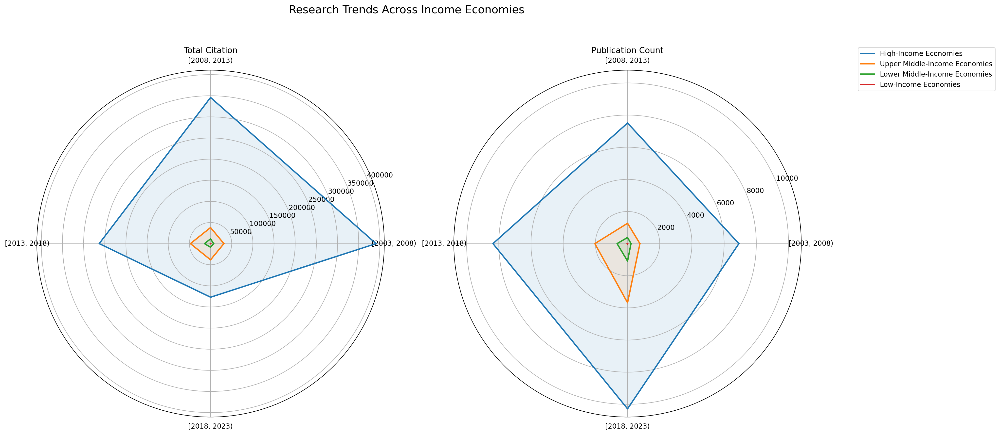

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming df is your DataFrame
df = pivot_df.drop(['index','global_south','global_south_not_china','China','United States',
                    'Global North','Global North Without US']).reset_index()

# Convert all levels of multi-index columns to strings
df.columns = df.columns.map(lambda x: tuple(map(str, x)))

# Sum the publication counts for each UN region
df['Total_Publication_Count'] = df['Publication Count'].apply(lambda x: x.sum(), axis=1)

# Sort the DataFrame by the total publication count
df = df.sort_values('Total_Publication_Count', ascending=False)

# Let's take Publication Count for this example
time_periods = ['[2003, 2008)', '[2008, 2013)', '[2013, 2018)', '[2018, 2023)']

# Mapping of income levels to full, readable names
region_mapping = {
    'global_south': 'Global South',
    'global_south_not_china': 'Global South (Excluding China)',
    'index': 'Global',
    'wb_high_income_economies': 'High-Income Economies',
    'wb_low_income_economies': 'Low-Income Economies',
    'wb_lower_middle_income_economies': 'Lower Middle-Income Economies',
    'wb_upper_middle_income_economies': 'Upper Middle-Income Economies'
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), subplot_kw=dict(polar=True))

# Set a global title
fig.suptitle('Research Trends Across Income Economies', fontsize=16)

# Loop through each region to plot data on the radar chart
for index, row in df.iterrows():
    region_name = region_mapping.get(row[(        'income',           '')], row[(        'income',           '')])
    values1 = row['Total Citation'][time_periods].values.flatten().tolist()
    values1 += values1[:1]
    values2 = row['Publication Count'][time_periods].values.flatten().tolist()
    values2 += values2[:1]

    angles = [n / float(len(time_periods)) * 2 * np.pi for n in range(len(time_periods))]
    angles += angles[:1]

    ax1.plot(angles, values1, linewidth=2) #, label=region_name
    ax1.fill(angles, values1, alpha=0.1)

    ax2.plot(angles, values2, linewidth=2, label=region_name)
    ax2.fill(angles, values2, alpha=0.1)

# Add axis labels
ax1.set_xticks(angles[:-1])
ax1.set_xticklabels(time_periods)
ax1.set_title('Total Citation')

ax2.set_xticks(angles[:-1])
ax2.set_xticklabels(time_periods)
ax2.set_title('Publication Count')

# Add legend
fig.legend(loc='upper right', bbox_to_anchor=(1.1, 0.9))

plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Radar_charts_income_across_periods.png", dpi=600)
plt.show()


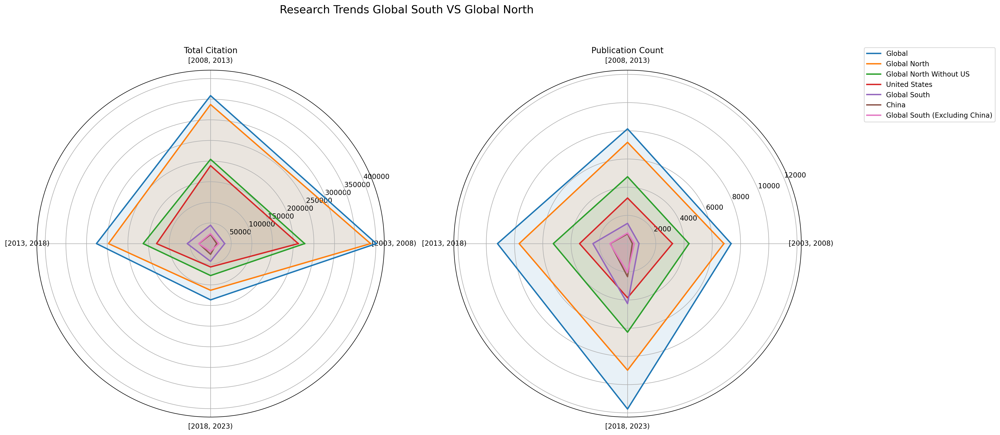

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming df is your DataFrame
df = pivot_df.drop(['wb_high_income_economies','wb_low_income_economies',
                    'wb_lower_middle_income_economies','wb_upper_middle_income_economies']).reset_index()

# Convert all levels of multi-index columns to strings
df.columns = df.columns.map(lambda x: tuple(map(str, x)))

# Sum the publication counts for each UN region
df['Total_Publication_Count'] = df['Publication Count'].apply(lambda x: x.sum(), axis=1)

# Sort the DataFrame by the total publication count
df = df.sort_values('Total_Publication_Count', ascending=False)

# Let's take Publication Count for this example
time_periods = ['[2003, 2008)', '[2008, 2013)', '[2013, 2018)', '[2018, 2023)']

# Mapping of income levels to full, readable names
region_mapping = {
    'global_south': 'Global South',
    'global_south_not_china': 'Global South (Excluding China)',
    'index': 'Global',
    'wb_high_income_economies': 'High-Income Economies',
    'wb_low_income_economies': 'Low-Income Economies',
    'wb_lower_middle_income_economies': 'Lower Middle-Income Economies',
    'wb_upper_middle_income_economies': 'Upper Middle-Income Economies'
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), subplot_kw=dict(polar=True))

# Set a global title
fig.suptitle('Research Trends Global South VS Global North', fontsize=16)

# Loop through each region to plot data on the radar chart
for index, row in df.iterrows():
    region_name = region_mapping.get(row[(        'income',           '')], row[(        'income',           '')])
    values1 = row['Total Citation'][time_periods].values.flatten().tolist()
    values1 += values1[:1]
    values2 = row['Publication Count'][time_periods].values.flatten().tolist()
    values2 += values2[:1]

    angles = [n / float(len(time_periods)) * 2 * np.pi for n in range(len(time_periods))]
    angles += angles[:1]

    ax1.plot(angles, values1, linewidth=2) #, label=region_name
    ax1.fill(angles, values1, alpha=0.1)

    ax2.plot(angles, values2, linewidth=2, label=region_name)
    ax2.fill(angles, values2, alpha=0.1)

# Add axis labels
ax1.set_xticks(angles[:-1])
ax1.set_xticklabels(time_periods)
ax1.set_title('Total Citation')

ax2.set_xticks(angles[:-1])
ax2.set_xticklabels(time_periods)
ax2.set_title('Publication Count')

# Add legend
fig.legend(loc='upper right', bbox_to_anchor=(1.1, 0.9))

plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Radar_charts_Global_South_across_periods.png", dpi=600)
plt.show()


# institutions

In [ ]:
import pandas as pd
import numpy as np
import re
from functools import reduce
import seaborn as sns
import missingno as msno
%matplotlib inline

import matplotlib.pyplot as plt
from scipy.stats import norm

In [ ]:
#Import data
data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_scholar_19.pkl').reset_index()
data = data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID'])

institution_data  = data.copy().reset_index().set_index(['wos_ID','Publication Year','Times Cited, All Databases'])[['Affiliations']]
institution_data #.head()

,,,Affiliations
wos_ID,Publication Year,"Times Cited, All Databases",
wos:000183215700003,2003,19,universidad de malaga
wos:000180955900018,2003,114,university of zurich
wos:000183683300008,2003,2,tel aviv university
wos:000184760800009,2003,26,university of arizona; university of arizona; ...
wos:000187153000005,2003,14,uppsala university; scripps research institute...
...,...,...,...
wos:000959867000004,2023,0,chinese academy of sciences; institute of phys...
wos:000968835000001,2023,0,fujian agriculture & forestry university
wos:000933339800001,2023,0,toyota central r&d labs inc


In [ ]:
institution_data['Affiliations'].count()

35498

In [ ]:
import pandas as pd

# Your DataFrame is named institution_data
institution_list = institution_data['Affiliations'].str.split(';').explode().str.strip()

# Count the unique institution names
unique_institution_count = institution_list.nunique()

print('The number of unique institution is:', unique_institution_count)

institution_list_df = institution_list.to_frame()
institution_list_df

The number of unique institution is: 5513


Affiliations
wos_ID              Publication Year Times Cited, All Databases                                          
wos:000183215700003 2003             19                                             universidad de malaga
wos:000180955900018 2003             114                                             university of zurich
wos:000183683300008 2003             2                                                tel aviv university
wos:000184760800009 2003             26                                             university of arizona
                                     26                                             university of arizona
...                                                                                                   ...
wos:000968835000001 2023             0                           fujian agriculture & forestry university
wos:000933339800001 2023             0                                        toyota central r&d labs inc
wos:000914484900001 2023             5                                                                NaN
wos:000912073200001 2023             1                                     sungkyunkwan university (skku)
                                     1                                     sungkyunkwan university (skku)

[145196 rows x 1 columns]

In [ ]:

# First merge
institution_data_merged_df = pd.merge(institution_list_df.reset_index(), topics_data_citation[['Topic N°','Year Group']].reset_index(), on='wos_ID', how='outer')

institution_data_merged_df#.head(60)

,wos_ID,Publication Year,"Times Cited, All Databases",Affiliations,Topic N°,Year Group
0,wos:000183215700003,2003,19,universidad de malaga,6,"[2003.0, 2008.0)"
1,wos:000180955900018,2003,114,university of zurich,11,"[2003.0, 2008.0)"
2,wos:000183683300008,2003,2,tel aviv university,11,"[2003.0, 2008.0)"
3,wos:000184760800009,2003,26,university of arizona,12,"[2003.0, 2008.0)"
4,wos:000184760800009,2003,26,university of arizona,12,"[2003.0, 2008.0)"
...,...,...,...,...,...,...
145191,wos:000968835000001,2023,0,fujian agriculture & forestry university,4,NaN
145192,wos:000933339800001,2023,0,toyota central r&d labs inc,12,NaN
145193,wos:000914484900001,2023,5,NaN,15,NaN
145194,wos:000912073200001,2023,1,sungkyunkwan university (skku),7,NaN


In [ ]:
import pandas as pd

# Assuming your data is loaded into a DataFrame called 'df'

# 1. Count of publications for each funder and topic
count_publications = institution_data_merged_df.groupby(['Affiliations', 'Topic N°']).size().unstack(fill_value=0)

# 2. Sum of citations for each funder and topic
sum_citations = institution_data_merged_df.groupby(['Affiliations', 'Topic N°'])['Times Cited, All Databases'].sum().unstack(fill_value=0)

# 3. Calculate the mean citation count for each topic and each funder
#    - We will use the counts from (1) and the sums from (2) to calculate means
mean_citations = sum_citations.divide(count_publications).fillna(0)

# Create multi-level columns
result = pd.concat([count_publications, sum_citations, mean_citations], axis=1,
                   keys=['count_publications', 'sum_citations', 'mean_citations'])

# Save data
result.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_Affiliations_clean_counts_citation.pkl')
result.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_Affiliations_clean_counts_citation.csv')

result

count_publications        \
Topic N°                                                           0  1  2    
Affiliations                                                                  
(adventhealth) central florida division                             0  0  0   
3m                                                                  0  0  0   
a*star - bioinformatics institute (bii)                             0  1  1   
a*star - bioprocessing technology institute (bti)                   0  0  0   
a*star - experimental drug development centre (...                  0  0  1   
...                                                               ... .. ..   
zunyi medical university                                            0  0  0   
zurich center integrative human physiology (zihp)                   0  0  0   
zurich university of applied sciences                               0  3  0   
zuse institute berlin                                               0  0  0   
zymogenet inc.                                                      0  0  0   

                                                                         ...  \
Topic N°                                           3  4  5  6  7  8  9   ...   
Affiliations                                                             ...   
(adventhealth) central florida division             0  0  0  0  0  1  0  ...   
3m                                                  0  2  0  1  0  0  0  ...   
a*star - bioinformatics institute (bii)             0  1  0  1  0  0  0  ...   
a*star - bioprocessing technology institute (bti)   0  3  0  1  0  1  0  ...   
a*star - experimental drug development centre (...  0  0  0  1  0  0  0  ...   
...                                                .. .. .. .. .. .. ..  ...   
zunyi medical university                            0  6  0  0  0  5  0  ...   
zurich center integrative human physiology (zihp)   0  0  0  0  0  0  0  ...   
zurich university of applied sciences               0  2  2  0  2  5  0  ...   
zuse institute berlin                               0  0  0  0  0  0  0  ...   
zymogenet inc.                                      0  0  0  5  0  0  0  ...   

                                                   mean_citations             \
Topic N°                                                       9          10   
Affiliations                                                                   
(adventhealth) central florida division                       0.0   0.000000   
3m                                                            0.0   0.000000   
a*star - bioinformatics institute (bii)                       0.0   0.000000   
a*star - bioprocessing technology institute (bti)             0.0   0.000000   
a*star - experimental drug development centre (...            0.0   0.000000   
...                                                           ...        ...   
zunyi medical university                                      0.0   0.000000   
zurich center integrative human physiology (zihp)             0.0  26.666667   
zurich university of applied sciences                         0.0   0.000000   
zuse institute berlin                                         0.0   0.000000   
zymogenet inc.                                                0.0   0.000000   

                                                                           \
Topic N°                                                   11    12    13   
Affiliations                                                                
(adventhealth) central florida division              0.000000   0.0   0.0   
3m                                                   0.000000  13.0   0.0   
a*star - bioinformatics institute (bii)             13.833333   0.0   0.0   
a*star - bioprocessing technology institute (bti)    0.000000   0.0   0.0   
a*star - experimental drug development centre (...  16.500000   0.0  20.0   
...                                                       ...   ...   ...   
zunyi med

In [ ]:
# To get the list of top 50 funders names
top_50_funders_names = institution_data_merged_df['Affiliations'].value_counts().head(50).index.tolist()

# Print or use the top_50_funders_names
top_50_funders_names

['university of california system',
 'udice-french research universities',
 'centre national de la recherche scientifique (cnrs)',
 'harvard university',
 'university of texas system',
 'chinese academy of sciences',
 'national institutes of health (nih) - usa',
 'university of helsinki',
 'russian academy of sciences',
 'n8 research partnership',
 'universite paris cite',
 'seoul national university (snu)',
 'consejo superior de investigaciones cientificas (csic)',
 'university of california berkeley',
 'united states department of energy (doe)',
 'pennsylvania commonwealth system of higher education (pcshe)',
 'university system of ohio',
 'university of toronto',
 'university of california san diego',
 'massachusetts institute of technology (mit)',
 'le reseau international des instituts pasteur (riip)',
 'university of copenhagen',
 'laval university',
 'harvard medical school',
 'texas a&m university system',
 'swiss federal institutes of technology domain',
 'universite paris sac

In [ ]:
# Filter the DataFrame to only include rows corresponding to Author
filtered_df = result.loc[top_50_funders_names]
filtered_df

count_publications       \
Topic N°                                                           0    1    
Affiliations                                                                 
university of california system                                    48  339   
udice-french research universities                                 33  364   
centre national de la recherche scientifique (c...                 34  269   
harvard university                                                 32  124   
university of texas system                                         27  124   
chinese academy of sciences                                        22  119   
national institutes of health (nih) - usa                          61   68   
university of helsinki                                              2   84   
russian academy of sciences                                        56   56   
n8 research partnership                                            19  123   
universite paris cite                                              10  129   
seoul national university (snu)                                     2   11   
consejo superior de investigaciones cientificas...                 30   73   
university of california berkeley                                  18  112   
united states department of energy (doe)                           15  149   
pennsylvania commonwealth system of higher educ...                 16   74   
university system of ohio                                          21  130   
university of toronto                                               7   34   
university of california san diego                                 18  100   
massachusetts institute of technology (mit)                        10  100   
le reseau international des instituts pasteur (...                  3   92   
university of copenhagen                                           22  132   
laval university                                                    2   55   
harvard medical school                                             25   34   
texas a&m university system                                         5   33   
swiss federal institutes of technology domain                       3   48   
universite paris saclay                                            12   66   
helmholtz association                                              14   59   
united states department of agriculture (usda)                      6   14   
texas a&m university college station                                5   29   
university of california san francisco                              7   25   
state university system of florida                                  2   78   
ku leuven                                                           8   59   
university system of maryland                                       2   40   
university system of georgia                                        6  106   
institut pasteur paris                                              3   91   
stanford university                                                 2   69   
white rose university consortium                                    8   47   
ohio state university                                              16  123   
university of texas austin                                         13   86   
institut national de la sante et de la recherch...                  7   41   
rutgers state university new brunswick                             84   28   
howard hughes medical institute                                    22   32   
inrae                                                               4   65   
university of pittsburgh                                            6   38   
university of illinois system                                      21   56   
polish academy of sciences                                         17   13   
university college cork                                             6   48   
johns hopkins university                                           10   1

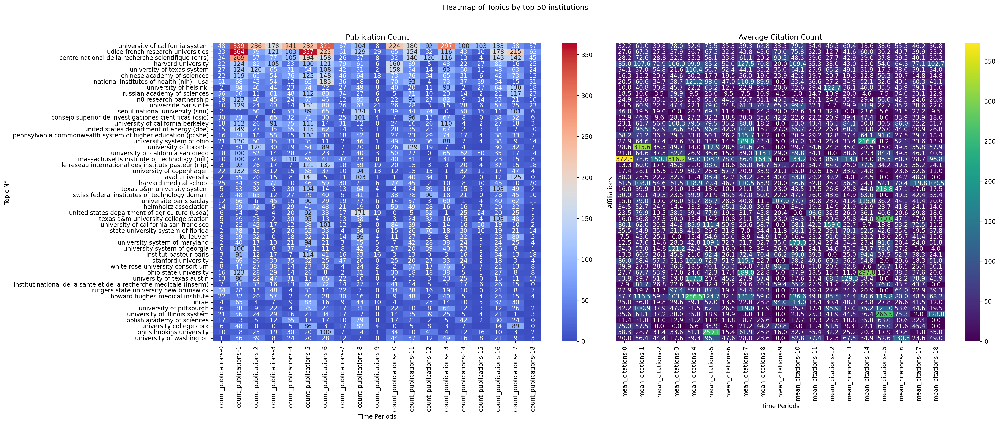

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data. Replace this with your actual DataFrame.
df = filtered_df

# Ensure that DataFrames are not empty
assert not df.empty, "Main DataFrame is empty!"

# Filter DataFrame based on column names
publication_columns = [col for col in df.columns if 'count_publications' in col]
total_citations_columns = [col for col in df.columns if 'sum_citations' in col]
average_citation_count_columns = [col for col in df.columns if 'mean_citations' in col]

# Assertions to check if any DataFrame is empty
assert publication_columns, "No columns matched for 'count_publications'"
assert total_citations_columns, "No columns matched for 'sum_citations'"
assert average_citation_count_columns, "No columns matched for 'mean_citations'"

publication_df = df[publication_columns]
total_citations_df = df[total_citations_columns]
average_citation_count_df = df[average_citation_count_columns]

# Generate subplots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Create the heatmaps
sns.heatmap(publication_df, annot=True, cmap="coolwarm", fmt=".0f", ax=axes[0], yticklabels=True)
axes[0].set_title('Publication Count')

#sns.heatmap(total_citations_df, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[1], yticklabels=False)
#axes[1].set_title('Total Citations')

sns.heatmap(average_citation_count_df, annot=True, cmap="viridis", fmt=".1f", ax=axes[1], yticklabels=False)
axes[1].set_title('Average Citation Count')

# Common settings
axes[0].set_ylabel('Topic N°')
for ax in axes:
    ax.set_xlabel('Time Periods')

# Super title for all subplots
plt.suptitle('Heatmap of Topics by top 50 institutions')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Heatmap of topics and Top 50 Institutions by Metrics.png", dpi=600)
plt.show()


# funder

In [ ]:
#Import data
data = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_scholar_19.pkl').reset_index()
data = data.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID'])

funder_data = data.copy().reset_index().set_index(['wos_ID','Times Cited, All Databases','Publication Year'])[['Funding Name Preferred']]
funder_data

,,,Funding Name Preferred
wos_ID,"Times Cited, All Databases",Publication Year,
wos:000183215700003,19,2003,NaN
wos:000180955900018,114,2003,NaN
wos:000183683300008,2,2003,NaN
wos:000184760800009,26,2003,NaN
wos:000187153000005,14,2003,NaN
...,...,...,...
wos:000959867000004,0,2023,national natural science foundation of china(n...
wos:000968835000001,0,2023,industry -university project of fujian provinc...
wos:000933339800001,0,2023,NaN


## funding yes or no

In [ ]:

# Last, replace NaN values with 'not_global_south' and non-NaN values with 'global_south'
funder_data['funder_trend'] = funder_data['Funding Name Preferred'].apply(lambda x: 'funding_trend_all' if pd.notna(x) else 'not_funding_trend_all')

# Then, get the counts of 'Publication Year' grouped by 'global_south' and the year
data_trend = funder_data.reset_index().groupby('funder_trend')['Publication Year'].value_counts().unstack(level=0)

# Finally, sort by the index (which is the 'Publication Year')
data_trend = data_trend.sort_index()
data_trend

funder_trend,funding_trend_all,not_funding_trend_all
Publication Year,,
2003,316,1135
2004,332,1106
2005,326,1017
2006,383,1048
2007,386,1105
2008,706,774
2009,1183,300
2010,1346,227
2011,1485,197


In [ ]:
funder_data

,,,Funding Name Preferred,funder_trend
wos_ID,"Times Cited, All Databases",Publication Year,,
wos:000183215700003,19,2003,NaN,not_funding_trend_all
wos:000180955900018,114,2003,NaN,not_funding_trend_all
wos:000183683300008,2,2003,NaN,not_funding_trend_all
wos:000184760800009,26,2003,NaN,not_funding_trend_all
wos:000187153000005,14,2003,NaN,not_funding_trend_all
...,...,...,...,...
wos:000959867000004,0,2023,national natural science foundation of china(n...,funding_trend_all
wos:000968835000001,0,2023,industry -university project of fujian provinc...,funding_trend_all
wos:000933339800001,0,2023,NaN,not_funding_trend_all


In [ ]:

# First merge
merged_df = pd.merge(funder_data.reset_index(), topics_data_citation[['Topic N°','Year Group']].reset_index(), on='wos_ID', how='outer')

merged_df#.head(60)

,wos_ID,"Times Cited, All Databases",Publication Year,Funding Name Preferred,funder_trend,Topic N°,Year Group
0,wos:000183215700003,19,2003,NaN,not_funding_trend_all,6,"[2003.0, 2008.0)"
1,wos:000180955900018,114,2003,NaN,not_funding_trend_all,11,"[2003.0, 2008.0)"
2,wos:000183683300008,2,2003,NaN,not_funding_trend_all,11,"[2003.0, 2008.0)"
3,wos:000184760800009,26,2003,NaN,not_funding_trend_all,12,"[2003.0, 2008.0)"
4,wos:000187153000005,14,2003,NaN,not_funding_trend_all,13,"[2003.0, 2008.0)"
...,...,...,...,...,...,...,...
36197,wos:000959867000004,0,2023,national natural science foundation of china(n...,funding_trend_all,13,NaN
36198,wos:000968835000001,0,2023,industry -university project of fujian provinc...,funding_trend_all,4,NaN
36199,wos:000933339800001,0,2023,NaN,not_funding_trend_all,12,NaN
36200,wos:000914484900001,5,2023,NaN,not_funding_trend_all,15,NaN


In [ ]:
# Count of funded and not funded for each topic
counts = merged_df.groupby(['Topic N°', 'funder_trend']).size().unstack(fill_value=0)

# Percentage of funded and not funded for each topic
total = counts.sum(axis=1)
percentages = counts.divide(total, axis=0) * 100

# Total citations for funded and not funded for each topic
total_citations = merged_df.groupby(['Topic N°', 'funder_trend'])['Times Cited, All Databases'].sum().unstack(fill_value=0)

# Mean citations for funded and not funded for each topic
mean_citations = merged_df.groupby(['Topic N°', 'funder_trend'])['Times Cited, All Databases'].mean().unstack(fill_value=0)

# Merging the results
result = pd.concat([counts, percentages, total_citations, mean_citations],
                  keys=['Count', 'Percentage', 'Total Citations', 'Mean Citations'],
                  axis=1)

result

Count                              Percentage  \
funder_trend funding_trend_all not_funding_trend_all funding_trend_all   
Topic N°                                                                 
0                          529                   178         74.823197   
1                         2343                   489         82.733051   
2                         1599                   729         68.685567   
3                         1046                   291         78.234854   
4                         1872                   633         74.730539   
5                         2687                   746         78.269735   
6                         2844                  1335         68.054559   
7                          809                   371         68.559322   
8                         2744                  1192         69.715447   
9                          292                   313         48.264463   
10                        1467                   386         79.168915   
11                        1433                   599         70.521654   
12                        1549                   731         67.938596   
13                        1089                   309         77.896996   
14                         852                   297         74.151436   
15                         215                   128         62.682216   
16                        1379                   390         77.953646   
17                        1439                   400         78.249048   
18                         371                   126         74.647887   

                                     Total Citations                        \
funder_trend not_funding_trend_all funding_trend_all not_funding_trend_all   
Topic N°                                                                     
0                        25.176803             15616                  5319   
1                        17.266949             90239                 25834   
2                        31.314433             40730                 24942   
3                        21.765146             37023                  9812   
4                        25.269461             51763                 25093   
5                        21.730265            100486                 52141   
6                        31.945441             63901                 48826   
7                        31.440678             27827                 13773   
8                        30.284553             68497                 41790   
9                        51.735537              6056                 10009   
10                       20.831085             50271                 18676   
11                       29.478346             33629                 20495   
12                       32.061404             38230                 27420   
13                       22.103004             36712                 14216   
14                       25.848564             24554                 13341   
15                       37.317784              6934                  3522   
16                       22.046354             44619                 18564   
17                       21.750952             33694                 14402   
18                       25.352113              9813                  3793   

                Mean Citations                        
funder_trend funding_trend_all not_funding_trend_all  
Topic N°                                              
0                    29.519849             29.882022  
1                    38.514298             52.830266  
2                    25.472170             34.213992  
3                    35.394837             33.718213  
4                    27.651175             39.641390  
5                    37.397097             69.894102  
6                    22.468706             36.573783  
7                    34.396786             37.123989  
8                    24.962464             35.058725  
9                  

In [ ]:

# Group by 'Topic N°', 'Publication Year', and 'funder_trend' and count
counts = merged_df.groupby(['Topic N°', 'Publication Year', 'funder_trend']).size().reset_index(name='count')

# Pivot the table to get counts of funded and non-funded per year for each topic
pivoted_counts = counts.pivot_table(index=['Topic N°', 'Publication Year'], columns='funder_trend', values='count', fill_value=0)

# Calculate the percentage of funded publications for each year and topic
pivoted_counts['funded_percentage'] = (pivoted_counts['funding_trend_all'] / (pivoted_counts['funding_trend_all'] + pivoted_counts['not_funding_trend_all'])) * 100

pivoted_counts

funder_trend               funding_trend_all  not_funding_trend_all  \
Topic N° Publication Year                                             
16       2006                             28                     51   
         2007                             22                     52   
         2008                             36                     30   
         2009                             65                      8   
         2010                             72                      3   
         2011                             90                      6   
         2012                             85                      7   
         2013                             98                      2   
         2014                             86                      3   
         2015                             84                      3   
         2016                             81                      6   
         2017                             80                      3   
         2018                             79                      7   
         2019                             68                      3   
         2020                             87                      2   
         2021                             78                      3   
         2022                            123                     12   
         2023                             49                      7   
17       2003                              7                     34   
         2004                              6                     33   
         2005                              3                     43   
         2006                              8                     44   
         2007                             14                     42   
         2008                             33                     39   
         2009                             47                     19   
         2010                             62                      8   
         2011                             72                      4   
         2012                             99                      8   
         2013                             78                      7   
         2014                             86                     10   
         2015                             73                      8   
         2016                             91                     11   
         2017                             93                      6   
         2018                            101                     15   
         2019                            122                     10   
         2020                            114                     14   
         2021                            129                      5   
         2022                            139                     20   
         2023                             62                     20   
18       2003                             14                     22   
         2004                             11                     22   
         2005                             13                     21   
         2006                             14                     15   
         2007                             22                     12   
         2008                             20                     14   
         2009                             25                      4   
         2010                             23                      3   
         2011                             23                      2   
         2012                             14                      0   
         2013                             25                      3   
         2014                             22                      1   
         2015                             16                      0   
         2016                             17                      0   
         2017                             21                      1   
         2018           

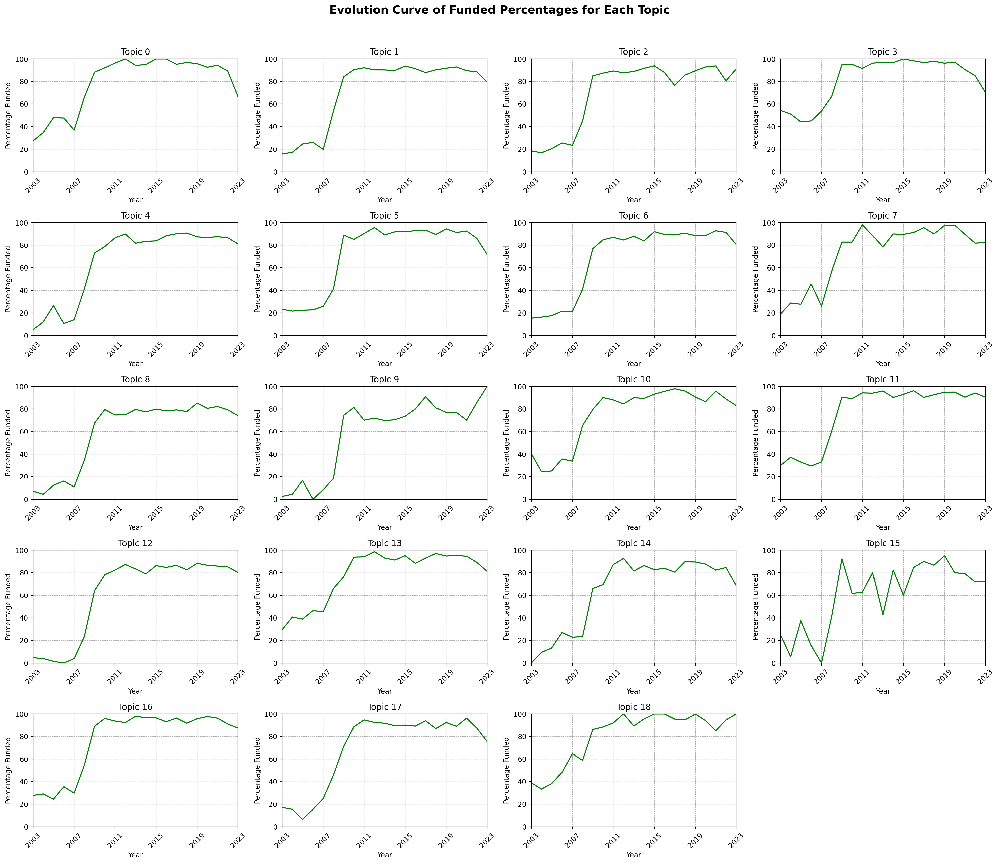

In [ ]:
import matplotlib.pyplot as plt

# Assuming you've already imported your data and named it 'pivoted_counts'

# =====================
# DATA TRANSFORMATION
# =====================

funded_percent_by_year = pivoted_counts.reset_index().pivot(index='Publication Year', columns='Topic N°', values='funded_percentage')
funded_percent_by_year = funded_percent_by_year.sort_index(axis=1)

# ====================
# PLOTTING PARAMETERS
# ====================

n_topics = len(funded_percent_by_year.columns)
n_rows = (n_topics + 3) // 4

# Define consistent x and y-axis scales
x_min, x_max = funded_percent_by_year.index.min(), funded_percent_by_year.index.max()
y_min, y_max = 0, 100  # As it's a percentage, it's between 0 and 100

# =================
# PLOTTING THE DATA
# =================

fig, axes = plt.subplots(n_rows, 4, figsize=(20, n_rows * 3.5))
axes_flat = axes.flatten()

for i, topic in enumerate(funded_percent_by_year.columns):
    axes_flat[i].plot(funded_percent_by_year.index, funded_percent_by_year[topic], color='green')  # Setting line color to green
    axes_flat[i].set_title(f'Topic {topic}')
    axes_flat[i].set_xlabel('Year')
    axes_flat[i].set_ylabel('Percentage Funded')
    axes_flat[i].grid(True, which='both', linestyle='--', linewidth=0.5)

    # Apply consistent x and y-axis limits
    axes_flat[i].set_xlim(x_min, x_max)
    axes_flat[i].set_ylim(y_min, y_max)

    # Set x-axis ticks to be integer years at regular intervals
    interval = (x_max - x_min) // 5  # for example, show every fifth year if the range is wide enough
    axes_flat[i].set_xticks(range(x_min, x_max + 1, interval))
    axes_flat[i].set_xticklabels(range(x_min, x_max + 1, interval), rotation=45)

for i in range(n_topics, len(axes_flat)):
    fig.delaxes(axes_flat[i])

fig.suptitle('Evolution Curve of Funded Percentages for Each Topic', fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_funded_percent_evolution_curves_subplot.png', dpi=600)
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming your DataFrame is named df
df = data_trend.iloc[:-1, :]


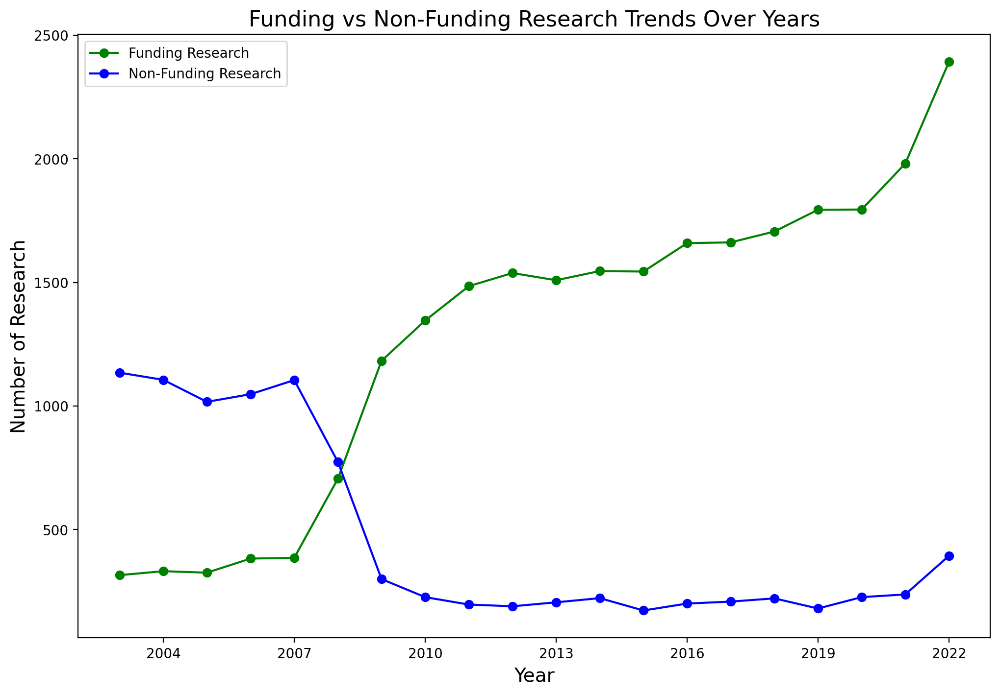

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Assuming df is your dataframe
df = data_trend.iloc[:-1, :]

fig, ax = plt.subplots(figsize=(12, 8))  # Explicitly create figure and axis

# Plotting the lines
ax.plot(df.index, df['funding_trend_all'], label='Funding Research', marker='o', color='green')
ax.plot(df.index, df['not_funding_trend_all'], label="Non-Funding Research", marker='o', color='blue')

# Adding labels, title and legend
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Number of Research', fontsize=14)
ax.set_title('Funding vs Non-Funding Research Trends Over Years', fontsize=16)
ax.legend()

# Grid for easier visualization
# ax.grid(True)

# Set integer ticks on the x-axis
ax.xaxis.set_major_locator(MaxNLocator(integer=True))

# Save the plot at 300 dpi
# plt.tight_layout()
plt.savefig('/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/funding_publication_year_plot.png', dpi=600)

plt.show()


## funder

In [ ]:
funder_data['Funding Name Preferred'].count()

26559

In [ ]:
#funder_data

In [ ]:
import pandas as pd

# Your DataFrame is named funder_data
funder_list = funder_data['Funding Name Preferred'].str.split(';').explode().str.strip()

# Count the unique funder names
unique_funder_count = funder_list.nunique()

print('The number of unique funder is:', unique_funder_count)

# Count the appearances of each funder
funder_counts = funder_list.value_counts().to_frame()

funder_counts['%'] = funder_counts['Funding Name Preferred']/funder_data['Funding Name Preferred'].count()*100

funder_counts##.head(50)

The number of unique funder is: 30676


,Funding Name Preferred,%
national natural science foundation of china(national natural science foundation of china (nsfc)),1997,7.519108
national institutes of health(united states department of health & human servicesnational institutes of health (nih) - usa),1367,5.147031
nih(united states department of health & human servicesnational institutes of health (nih) - usa),1285,4.838285
,1232,4.638729
national science foundation(national science foundation (nsf)),916,3.448925
...,...,...
fcmb aps,1,0.003765
start programme(austrian science fund (fwf)),1,0.003765
national science centre within sonata,1,0.003765
european union framework 7 programme health project concord (control of community-acquired mrsa: rationale and development of counteractions),1,0.003765


In [ ]:
#funder_list

In [ ]:
funder_list2 = funder_list.to_frame().reset_index().set_index('Funding Name Preferred')
#funder_list2

In [ ]:
# import funder clean
funder_counts_clean = pd.read_excel(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Funding-Name-Preferred-csv2.xls')[
    ['Funding_Name_Preferred','Funding_Name_Preferred.1','Funding_Name_Preferred_clean']].set_index('Funding_Name_Preferred.1')
#funder_counts_clean

In [ ]:
funder_list_and_clean = funder_list2.merge(funder_counts_clean,
                                           left_on='Funding Name Preferred',
                                           right_on='Funding_Name_Preferred',
                                           how='left').set_index(['wos_ID','Publication Year'])
funder_list_and_clean

,,"Times Cited, All Databases",Funding_Name_Preferred,Funding_Name_Preferred_clean
wos_ID,Publication Year,,,
wos:000183215700003,2003,19,NaN,NaN
wos:000180955900018,2003,114,NaN,NaN
wos:000183683300008,2003,2,NaN,NaN
wos:000184760800009,2003,26,NaN,NaN
wos:000187153000005,2003,14,NaN,NaN
...,...,...,...,...
wos:000933339800001,2023,0,NaN,NaN
wos:000914484900001,2023,5,NaN,NaN
wos:000912073200001,2023,1,national research foundation of korea(national...,national research foundation of korea (nrf)


In [ ]:

# First merge
funder_list_and_clean2 = pd.merge(funder_list_and_clean.reset_index(),
                                  topics_data_citation[['Topic N°','Year Group']].reset_index(),
                                  on='wos_ID', how='outer')#.set_index(['wos_ID','Publication Year'])

funder_list_and_clean2#.head(60)

,wos_ID,Publication Year,"Times Cited, All Databases",Funding_Name_Preferred,Funding_Name_Preferred_clean,Topic N°,Year Group
0,wos:000183215700003,2003,19,NaN,NaN,6,"[2003.0, 2008.0)"
1,wos:000180955900018,2003,114,NaN,NaN,11,"[2003.0, 2008.0)"
2,wos:000183683300008,2003,2,NaN,NaN,11,"[2003.0, 2008.0)"
3,wos:000184760800009,2003,26,NaN,NaN,12,"[2003.0, 2008.0)"
4,wos:000187153000005,2003,14,NaN,NaN,13,"[2003.0, 2008.0)"
...,...,...,...,...,...,...,...
84909,wos:000933339800001,2023,0,NaN,NaN,12,NaN
84910,wos:000914484900001,2023,5,NaN,NaN,15,NaN
84911,wos:000912073200001,2023,1,national research foundation of korea(national...,national research foundation of korea (nrf),7,NaN
84912,wos:000912073200001,2023,1,development of next-generation biorefinery pla...,development of next-generation biorefinery pla...,7,NaN


In [ ]:
import pandas as pd

# Assuming your data is loaded into a DataFrame called 'df'

# 1. Count of publications for each funder and topic
count_publications = funder_list_and_clean2.groupby(['Funding_Name_Preferred_clean', 'Topic N°']).size().unstack(fill_value=0)

# 2. Sum of citations for each funder and topic
sum_citations = funder_list_and_clean2.groupby(['Funding_Name_Preferred_clean', 'Topic N°'])['Times Cited, All Databases'].sum().unstack(fill_value=0)

# 3. Calculate the mean citation count for each topic and each funder
#    - We will use the counts from (1) and the sums from (2) to calculate means
mean_citations = sum_citations.divide(count_publications).fillna(0)

# Create multi-level columns
result = pd.concat([count_publications, sum_citations, mean_citations], axis=1,
                   keys=['count_publications', 'sum_citations', 'mean_citations'])

# Save data
result.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_funder_clean_counts_citation.pkl')
result.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/TOPICS_funder_clean_counts_citation.csv')

result

count_publications        \
Topic N°                                                           0  1  2    
Funding_Name_Preferred_clean                                                  
'association de chefs de service du chru de nan...                  0  0  0   
'castile and leon' autonomy (spain)                                 0  0  0   
'centre de recherche public-sante', luxembourg                      0  0  1   
'complexo de central de apoio a pesquisa (comca...                  0  0  0   
'conseil general de l'eure'                                         0  0  0   
...                                                               ... .. ..   
zunyi science and technology cooperation                            0  0  0   
zurcher krebsliga                                                   0  0  0   
zurich center for integrative human physiology ...                  0  0  0   
zymo research                                                       0  0  1   
zymogenetics                                                        0  0  0   

                                                                         ...  \
Topic N°                                           3  4  5  6  7  8  9   ...   
Funding_Name_Preferred_clean                                             ...   
'association de chefs de service du chru de nan...  0  0  0  0  0  0  0  ...   
'castile and leon' autonomy (spain)                 0  0  0  1  0  0  0  ...   
'centre de recherche public-sante', luxembourg      0  0  0  1  0  0  0  ...   
'complexo de central de apoio a pesquisa (comca...  0  1  0  0  0  0  0  ...   
'conseil general de l'eure'                         0  0  0  0  0  0  0  ...   
...                                                .. .. .. .. .. .. ..  ...   
zunyi science and technology cooperation            0  0  0  0  0  2  0  ...   
zurcher krebsliga                                   0  0  0  0  0  0  0  ...   
zurich center for integrative human physiology ...  0  0  0  0  0  0  0  ...   
zymo research                                       0  0  0  0  0  0  0  ...   
zymogenetics                                        0  0  0  1  0  0  0  ...   

                                                   mean_citations             \
Topic N°                                                       9     10   11   
Funding_Name_Preferred_clean                                                   
'association de chefs de service du chru de nan...            0.0   0.0  1.0   
'castile and leon' autonomy (spain)                           0.0   0.0  0.0   
'centre de recherche public-sante', luxembourg                0.0   0.0  0.0   
'complexo de central de apoio a pesquisa (comca...            0.0   0.0  0.0   
'conseil general de l'eure'                                   0.0   0.0  0.0   
...                                                           ...   ...  ...   
zunyi science and technology cooperation                      0.0   0.0  0.0   
zurcher krebsliga                                             0.0  68.0  0.0   
zurich center for integrative human physiology ...            0.0  11.0  0.0   
zymo research                                                 0.0   0.0  0.0   
zymogenetics                                                  0.0   0.0  0.0   

                                                                              \
Topic N°                                             12   13   14   15    16   
Funding_Name_Preferred_clean                                                   
'association de chefs de service du chru de nan...  0.0  0.0  0.0  0.0   0.0   
'castile and leon' autonomy (spain)                 0.0  0.0  0.0  0.0   0.0   
'centre de recherche public-sante', luxembourg      0.0  0.0  0.0  0.0   0.0   
'complexo de central de apoio a pesquisa (comca...  0.0  0.0  0.0  0.0   0.0   
'conseil general de l'eure'                         0.0  0.0  0.0  0.0  13.0   
...                                                 ...  ...  

In [ ]:
# To get the list of top 50 funders names
top_50_funders_names = funder_list_and_clean['Funding_Name_Preferred_clean'].value_counts().head(50).index.tolist()

# Print or use the top_50_funders_names
top_50_funders_names

['national institutes of health (nih) - usa',
 'national natural science foundation of china (nsfc)',
 'national science foundation (nsf)',
 'european commission',
 'biotechnology and biological sciences research council (bbsrc)',
 'usanih national institute of general medical sciences (nigms)',
 'ministry of education, culture, sports, science and technology, japan (mext)',
 'usanih national institute of allergy & infectious diseases (niaid)',
 'medical research council uk (mrc)',
 'national research foundation of korea (nrf)',
 'german research foundation (dfg)',
 'natural sciences and engineering research council of canada (nserc)',
 'usanih national cancer institute (nci)',
 'united states department of energy (doe)',
 'wellcome trust',
 'united states department of agriculture (usda)',
 'fundacao para a ciencia e a tecnologia (fct)',
 'nsf - directorate for biological sciences (bio)',
 'japan society for the promotion of science (jsps kakenhi)',
 'nsf - directorate for mathematica

In [ ]:
# Filter the DataFrame to only include rows corresponding to Author
filtered_df = result.loc[top_50_funders_names]
filtered_df

count_publications       \
Topic N°                                                           0    1    
Funding_Name_Preferred_clean                                                 
national institutes of health (nih) - usa                         133  269   
national natural science foundation of china (n...                 26  236   
national science foundation (nsf)                                  41  410   
european commission                                                28  229   
biotechnology and biological sciences research ...                 63  171   
usanih national institute of general medical sc...                 86   68   
ministry of education, culture, sports, science...                 17   57   
usanih national institute of allergy & infectio...                 19   44   
medical research council uk (mrc)                                  21   70   
national research foundation of korea (nrf)                        12   33   
german research foundation (dfg)                                   32   99   
natural sciences and engineering research counc...                 13  101   
usanih national cancer institute (nci)                             19   12   
united states department of energy (doe)                           16  145   
wellcome trust                                                     25   86   
united states department of agriculture (usda)                      5   43   
fundacao para a ciencia e a tecnologia (fct)                        1   25   
nsf - directorate for biological sciences (bio)                    11  189   
japan society for the promotion of science (jsp...                  6   26   
nsf - directorate for mathematical & physical s...                 12   42   
agence nationale de la recherche (anr)                              1   91   
national key research and development program o...                  2   51   
research council of finland                                         1   71   
nsf - directorate for engineering (eng)                             8   10   
canadian institutes of health research (cihr)                       3   40   
united states department of defense                                 3   33   
howard hughes medical institute                                    10   51   
swiss national science foundation (snsf)                            2   31   
conselho nacional de desenvolvimento cientifico...                  0   21   
engineering & physical sciences research counci...                  3   28   
fundamental research funds for the central univ...                  2   31   
natural environment research council (nerc)                         1  231   
australian research council (arc)                                   9   78   
national basic research program of china                            4   16   
european research council (erc)                                     7   75   
coordenacao de aperfeicoamento de pessoal de ni...                  1   21   
chinese academy of sciences                                         3   31   
federal ministry of education & research (bmbf)                     3   11   
russian science foundation (rsf)                                    9   15   
science foundation ireland                                          4   34   
centre national de la recherche scientifique (c...                  3   41   
usanih national center for research resources (...                  7   11   
consejo nacional de ciencia y tecnologia (conacyt)                  4   23   
swedish research council formas                                     4   20   
national health and medical research council (n...                  6   18   
fundacao de amparo a pesquisa do estado de sao ...                  0    9   
direct for biological sciences                                      6   70   
russian foundation for basic research (rfbr)                       14   17   
department of biotechnology (dbt) india                            10   1

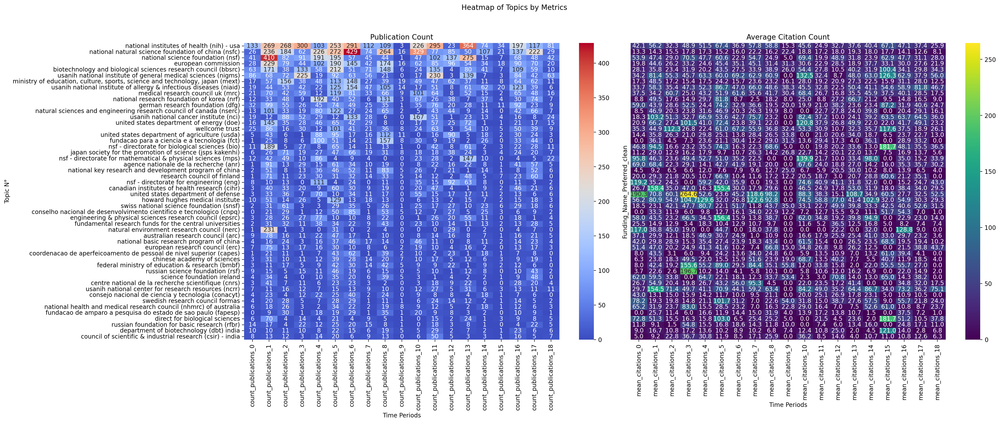

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data. Replace this with your actual DataFrame.
df = filtered_df

# Ensure that DataFrames are not empty
assert not df.empty, "Main DataFrame is empty!"

# Filter DataFrame based on column names
publication_columns = [col for col in df.columns if 'count_publications' in col]
total_citations_columns = [col for col in df.columns if 'sum_citations' in col]
average_citation_count_columns = [col for col in df.columns if 'mean_citations' in col]

# Assertions to check if any DataFrame is empty
assert publication_columns, "No columns matched for 'count_publications'"
assert total_citations_columns, "No columns matched for 'sum_citations'"
assert average_citation_count_columns, "No columns matched for 'mean_citations'"

publication_df = df[publication_columns]
total_citations_df = df[total_citations_columns]
average_citation_count_df = df[average_citation_count_columns]

# Generate subplots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Create the heatmaps
sns.heatmap(publication_df, annot=True, cmap="coolwarm", fmt=".0f", ax=axes[0], yticklabels=True)
axes[0].set_title('Publication Count')

#sns.heatmap(total_citations_df, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[1], yticklabels=False)
#axes[1].set_title('Total Citations')

sns.heatmap(average_citation_count_df, annot=True, cmap="viridis", fmt=".1f", ax=axes[1], yticklabels=False)
axes[1].set_title('Average Citation Count')

# Common settings
axes[0].set_ylabel('Topic N°')
for ax in axes:
    ax.set_xlabel('Time Periods')

# Super title for all subplots
plt.suptitle('Heatmap of Topics by Metrics')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
#plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Heatmap of TOPICs by Metrics.png", dpi=600)
plt.show()


# topics

In [ ]:
topics_data_citation = pd.read_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topic_probability_scholar_19.pkl').reset_index()[
    ['UT (Unique WOS ID)','Publication Year','Topic N°', 'Times Cited, All Databases']]

topics_data_citation = topics_data_citation.rename(columns={"UT (Unique WOS ID)": "wos_ID"}).set_index(['wos_ID'])
topics_data_citation

,Publication Year,Topic N°,"Times Cited, All Databases"
wos_ID,,,
wos:000183215700003,2003,6,19
wos:000180955900018,2003,11,114
wos:000183683300008,2003,11,2
wos:000184760800009,2003,12,26
wos:000187153000005,2003,13,14
...,...,...,...
wos:000959867000004,2023,13,0
wos:000968835000001,2023,4,0
wos:000933339800001,2023,12,0


In [ ]:
#citation_data = data.copy().reset_index().set_index(['wos_ID','Publication Year'])[['Times Cited, All Databases']]
#citation_data

In [ ]:
#topics_data_citation = pd.concat([topics_data, citation_data], axis=1)
#topics_data_citation

In [ ]:
# Count the unique topic names
unique_topic_count = topics_data_citation['Topic N°'].nunique()

print('The number of unique topics is:', unique_topic_count)

#
topics_data_citation2 = topics_data_citation.reset_index()

# and sum citations within each group
grouped = topics_data_citation2.groupby(['Topic N°']).agg({'wos_ID': 'count', 'Times Cited, All Databases': 'sum'}).reset_index()

grouped['%'] = grouped['wos_ID']/topics_data_citation['Topic N°'].count()*100

grouped['Average Citation Count'] = grouped['Times Cited, All Databases']/grouped['wos_ID']

# Rename columns
grouped.columns = ['Topic N°', 'Publication Count', 'Total Citations', '%','Average Citation Count']

# Save data
grouped.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topics_counts_citation.pkl')
grouped.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topics_counts_citation.csv')

grouped##.head(50)

The number of unique topics is: 19


,Topic N°,Publication Count,Total Citations,%,Average Citation Count
0,0,707,20935,1.952931,29.611033
1,1,2832,116073,7.822772,40.986229
2,2,2328,65672,6.430584,28.209622
3,3,1337,46835,3.693166,35.029918
4,4,2505,76856,6.919507,30.681038
5,5,3433,152627,9.482901,44.458782
6,6,4179,112727,11.543561,26.974635
7,7,1180,41600,3.259488,35.254237
8,8,3936,110287,10.872327,28.020071
9,9,605,16065,1.671178,26.553719


In [ ]:
import pandas as pd

# Assuming df is your DataFrame
# Sort the DataFrame based on the "count" column in descending order
sorted_df = grouped.sort_values(by="Publication Count", ascending=False)

# Get the top 50 funders
#top_50_funders = sorted_df.head(50)

# To get the list of top 50 funders names
sorted_topics_names = sorted_df["Topic N°"].tolist()

# Print or use the top_50_funders_names
sorted_topics_names

[6, 8, 5, 1, 4, 2, 12, 11, 10, 17, 16, 13, 3, 7, 14, 0, 9, 18, 15]

In [ ]:
topics_data2 = topics_data_citation.reset_index()#.set_index('wos_ID')
# Create a new column, 'Year Group', to indicate which 5-year group each row belongs to
topics_data2['Year Group'] = pd.cut(topics_data2['Publication Year'], bins=range(2003, 2025, 5), right=False)

# Group by 'Year Group' and 'Topic N°', count number of publications
# and sum citations within each group
grouped = topics_data2.groupby(['Year Group','Topic N°']).agg({'wos_ID': 'count', 'Times Cited, All Databases': 'sum'}).reset_index()
grouped['Average Citation Count'] = grouped['Times Cited, All Databases']/grouped['wos_ID']
# Create a boolean mask to identify rows with 0 in the 'wos_ID' column
mask = (grouped['wos_ID'] == 0)

# Use the mask to drop rows with 0 in the 'wos_ID' column
grouped_filtered = grouped[~mask]

# Rename columns
grouped_filtered.columns = ['Year Group','Topic N°', 'Publication Count', 'Total Citations', 'Average Citation Count']

#grouped_filtered


In [ ]:
# Pivot the DataFrame
pivot_df = grouped_filtered.pivot(index='Topic N°', columns='Year Group', values=['Publication Count', 'Total Citations', 'Average Citation Count'])

# Fill NaN values with 0
#pivot_df.fillna(0, inplace=True)
# Save data
pivot_df.to_pickle(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topics_list_count_citation_group_year.pkl')
pivot_df.to_csv(f'/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/topics_list_count_citation_group_year.csv')

# Print the pivoted DataFrame
# Replace NaN values with 0 in-place
pivot_df.fillna(0)


Publication Count                                         \
Year Group      [2003, 2008) [2008, 2013) [2013, 2018) [2018, 2023)   
Topic N°                                                              
0                      224.0        171.0        162.0        138.0   
1                      236.0        462.0        752.0       1217.0   
2                      592.0        632.0        579.0        480.0   
3                      448.0        342.0        304.0        216.0   
4                      328.0        526.0        685.0        860.0   
5                      535.0        660.0        854.0       1267.0   
6                     1034.0       1002.0       1075.0        980.0   
7                      370.0        290.0        250.0        253.0   
8                      469.0        591.0        927.0       1722.0   
9                      206.0        195.0        130.0         71.0   
10                     316.0        412.0        468.0        557.0   
11                     694.0        549.0        429.0        339.0   
12                     370.0        516.0        585.0        733.0   
13                     335.0        408.0        377.0        262.0   
14                     121.0        200.0        283.0        491.0   
15                      73.0         69.0         57.0        119.0   
16                     403.0        402.0        446.0        462.0   
17                     234.0        391.0        463.0        669.0   
18                     166.0        128.0        106.0         94.0   

                        Total Citations                            \
Year Group [2023, 2028)    [2003, 2008) [2008, 2013) [2013, 2018)   
Topic N°                                                            
0                  12.0          7591.0       6244.0       5773.0   
1                 165.0         24426.0      28932.0      40022.0   
2                  45.0         26768.0      22185.0      12536.0   
3                  27.0         18105.0      12587.0      11060.0   
4                 106.0         20471.0      26138.0      20731.0   
5                 117.0         51544.0      57237.0      29896.0   
6                  88.0         45688.0      36000.0      22039.0   
7                  17.0         20625.0      10566.0       7021.0   
8                 227.0         29151.0      27561.0      31659.0   
9                   3.0          8537.0       4673.0       2256.0   
10                100.0         22876.0      22601.0      15506.0   
11                 21.0         26353.0      16567.0       8491.0   
12                 76.0         20608.0      20271.0      15600.0   
13                 16.0         20281.0      16949.0      10799.0   
14                 54.0          8106.0      10102.0      11688.0   
15                 25.0          3648.0       2409.0       2199.0   
16                 56.0         24801.0      19608.0      13402.0   
17                 82.0         14337.0      14337.0      13315.0   
18                  3.0          7134.0       3674.0       2062.0   

                                     Average Citation Count               \
Year Group [2018, 2023) [2023, 2028)           [2003, 2008) [2008, 2013)   
Topic N°                                                                   
0                1324.0          3.0              33.888393    36.514620   
1               22641.0         52.0             103.500000    62.623377   
2                4174.0          9.0              45.216216    35.102848   
3                5078.0          5.0              40.412946    36.804094   
4                9488.0         28.0              62.411585    49.692015   
5               13930.0         20.0              96.343925    86.722727   
6                8982.0         18.0              44.185687    35.928144   
7                3375.0         13.0              55.743243    36.434483   
8               21799.0        117.0              62.155650    46.634518   
9                

In [ ]:
# Your list of top 50 Authors
# Filter the DataFrame to only include rows corresponding to Author
filtered_df = pivot_df.loc[sorted_topics_names]

filtered_df.columns = filtered_df.columns.map(lambda x: f"{x[0]}_{x[1]}")

# Rename the columns
new_columns = []
for col in filtered_df.columns:
    metric, year_group = col.split('_')
    year_group = year_group.replace('[', '').replace(')', '').replace(',', '-')
    if metric == 'Publication Count':
        new_columns.append(f'PC_{year_group}')
    elif metric == 'Total Citations':
        new_columns.append(f'TC_{year_group}')
    elif metric == 'Average Citation Count':
        new_columns.append(f'ACC_{year_group}')

filtered_df.columns = new_columns

# Sort the DataFrame based on the "count" column in descending order
#filtered_df = filtered_df.sort_values(by="PC_2018- 2023", ascending=False)

# Show the DataFrame with the new single-level columns
filtered_df

,PC_2003- 2008,PC_2008- 2013,PC_2013- 2018,PC_2018- 2023,PC_2023- 2028,TC_2003- 2008,TC_2008- 2013,TC_2013- 2018,TC_2018- 2023,TC_2023- 2028,ACC_2003- 2008,ACC_2008- 2013,ACC_2013- 2018,ACC_2018- 2023,ACC_2023- 2028
Topic N°,,,,,,,,,,,,,,,
6,1034.0,1002.0,1075.0,980.0,88.0,45688.0,36000.0,22039.0,8982.0,18.0,44.185687,35.928144,20.501395,9.165306,0.204545
8,469.0,591.0,927.0,1722.0,227.0,29151.0,27561.0,31659.0,21799.0,117.0,62.155650,46.634518,34.152104,12.659117,0.515419
5,535.0,660.0,854.0,1267.0,117.0,51544.0,57237.0,29896.0,13930.0,20.0,96.343925,86.722727,35.007026,10.994475,0.170940
1,236.0,462.0,752.0,1217.0,165.0,24426.0,28932.0,40022.0,22641.0,52.0,103.500000,62.623377,53.220745,18.603944,0.315152
4,328.0,526.0,685.0,860.0,106.0,20471.0,26138.0,20731.0,9488.0,28.0,62.411585,49.692015,30.264234,11.032558,0.264151
2,592.0,632.0,579.0,480.0,45.0,26768.0,22185.0,12536.0,4174.0,9.0,45.216216,35.102848,21.651123,8.695833,0.200000
12,370.0,516.0,585.0,733.0,76.0,20608.0,20271.0,15600.0,9148.0,23.0,55.697297,39.284884,26.666667,12.480218,0.302632
11,694.0,549.0,429.0,339.0,21.0,26353.0,16567.0,8491.0,2710.0,3.0,37.972622,30.176685,19.792541,7.994100,0.142857
10,316.0,412.0,468.0,557.0,100.0,22876.0,22601.0,15506.0,7907.0,57.0,72.392405,54.856796,33.132479,14.195691,0.570000


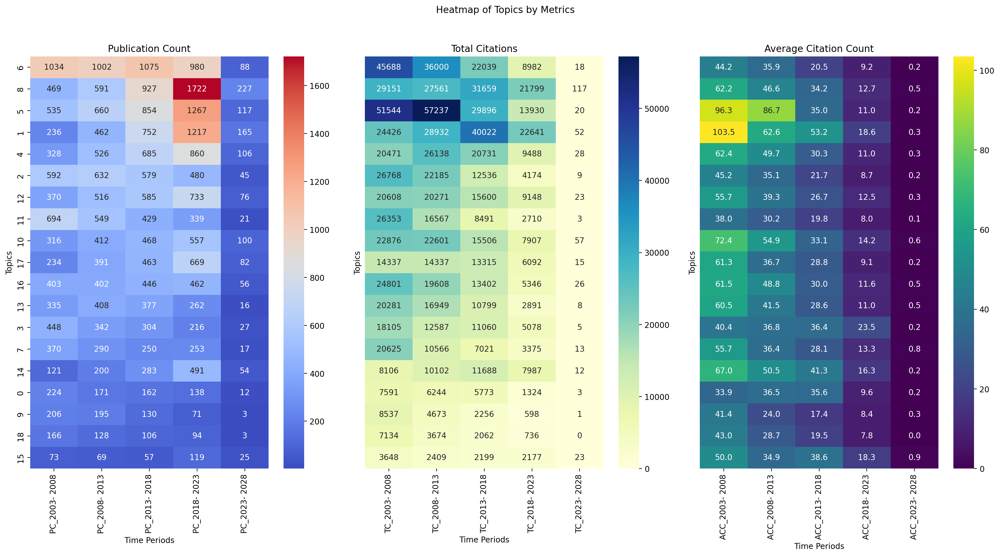

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data. Replace this with your own data.
df = filtered_df
df.index.name = 'Topics'

# Filter DataFrame based on group
publication_columns = [col for col in df.columns if 'PC' in col]
total_citations_columns = [col for col in df.columns if 'TC' in col]
average_citation_count_columns = [col for col in df.columns if 'ACC' in col]

publication_df = df[publication_columns]
total_citations_df = df[total_citations_columns]
average_citation_count_df = df[average_citation_count_columns]

# Generate subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 10))

# Create the heatmaps
sns.heatmap(publication_df, annot=True, cmap="coolwarm", fmt=".0f", ax=axes[0], yticklabels=True)
axes[0].set_title('Publication Count')

sns.heatmap(total_citations_df, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[1], yticklabels=False)
axes[1].set_title('Total Citations')

sns.heatmap(average_citation_count_df, annot=True, cmap="viridis", fmt=".1f", ax=axes[2], yticklabels=False)
axes[2].set_title('Average Citation Count')

# Common settings
axes[0].set_ylabel('Topics')
for ax in axes:
    ax.set_xlabel('Time Periods')

# Super title for all subplots
plt.suptitle('Heatmap of Topics by Metrics')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save the figure
plt.savefig("/content/drive/MyDrive/YORKU PROJECT/JUDE/BACTERIOPHAGE/Heatmap of Topics by Metrics.png", dpi=600)
plt.show()


In [ ]:
xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

NameError: ignored

In [ ]:
country_data['number_of_country'] = country_data.notnull().sum(axis=1)
number_country = country_data[['number_of_country']]
number_country = number_country.reset_index().rename(columns = {'UT (Unique WOS ID)':'wos_ID'})
number_country['wos_ID'] = number_country['wos_ID'].str.lower()
number_country

In [ ]:
number_country.describe()

In [ ]:
number_country.isna().sum()

In [ ]:
# number_country#.head(60)

In [ ]:
data_and_number_country = pd.concat([data.set_index('wos_ID'),
                           number_country.set_index('wos_ID')],
                          axis=1)
data_and_number_country#.head(2)

In [ ]:
# to drop rows with 0 values in column 'number_of_country':
data_and_number_country = data_and_number_country[data_and_number_country['number_of_country'] != 0]

In [ ]:
# data_and_number_country.describe()

In [ ]:
data_and_number_country.isna().sum()

## analysis based on number of country

### proportion all

In [ ]:
data_and_number_country['number_of_country'].isna().sum()

In [ ]:
data_and_number_countryT = data_and_number_country.T

data_and_number_countryT['countries'] = data_and_number_countryT.index

number_of_country_mean_list = []
number_of_country_count_list = []
for country in data_and_number_country.columns:
    number_of_country_count_list.append(data_and_number_country.dropna(subset=[country])['number_of_country'].count())
    number_of_country_mean_list.append(data_and_number_country.dropna(subset=[country])['number_of_country'].mean())

# rename countries names on columns
countries = data_and_number_country.columns.to_list()
number_of_country_count  = number_of_country_count_list
number_of_country_mean = number_of_country_mean_list

data_and_number_countryT_count = pd.DataFrame({'countries': countries, 'all_number_of_country_count': number_of_country_count})
data_and_number_countryT_mean = pd.DataFrame({'countries': countries, 'all_number_of_country_mean': number_of_country_mean})

# ********
data_and_number_countryT_concat = data_and_number_countryT.reset_index().merge(data_and_number_countryT_count, on = 'countries', how='left')
data_and_number_countryT_concat = data_and_number_countryT_concat.merge(data_and_number_countryT_mean, on = 'countries', how='left')

data_and_number_countryT_concat_all = data_and_number_countryT_concat[['countries','all_number_of_country_count','all_number_of_country_mean']]

# save data
data_and_number_countryT_concat_all.to_csv(f'../TABLES/region_countries_org_number_of_country_count_mean.csv')
data_and_number_countryT_concat_all

In [ ]:
len(number_of_country_count)

In [ ]:
len(number_of_country_mean)

In [ ]:
len(countries)

In [ ]:
vvvvvvvvvvvvvvvvvv

### proportion fund

In [ ]:
data_and_number_country_fund = data_and_number_country.loc[data_and_number_country['funding_yes'] == 1]
data_and_number_country_fund.shape

In [ ]:
data_and_number_countryT = data_and_number_country_fund.T

data_and_number_countryT['countries'] = data_and_number_countryT.index

number_of_country_mean_list = []
number_of_country_count_list = []
for country in data_and_number_country_fund.columns:
    number_of_country_count_list.append(data_and_number_country_fund.dropna(subset=[country])['number_of_country'].count())
    number_of_country_mean_list.append(data_and_number_country_fund.dropna(subset=[country])['number_of_country'].mean())

# rename countries names on columns
countries = data_and_number_country_fund.columns.to_list()
number_of_country_count  = number_of_country_count_list
number_of_country_mean = number_of_country_mean_list

data_and_number_countryT_count = pd.DataFrame({'countries': countries, 'fund_number_of_country_count': number_of_country_count})
data_and_number_countryT_mean = pd.DataFrame({'countries': countries, 'fund_number_of_country_mean': number_of_country_mean})

# ********
data_and_number_countryT_concat = data_and_number_countryT.reset_index().merge(data_and_number_countryT_count, on = 'countries', how='left')
data_and_number_countryT_concat = data_and_number_countryT_concat.merge(data_and_number_countryT_mean, on = 'countries', how='left')

data_and_number_countryT_concat_number_of_country_fund = data_and_number_countryT_concat[['countries','fund_number_of_country_count','fund_number_of_country_mean']]

# save data
# data_and_number_countryT_concat_all.to_csv(f'../TABLES/countries_fund_number_of_country_count_mean.csv')
data_and_number_countryT_concat_number_of_country_fund

### proportion no fund

In [ ]:
data_and_number_country_no_fund = data_and_number_country.loc[data_and_number_country['funding_yes'] == 0]
data_and_number_country_no_fund.shape

In [ ]:
data_and_number_countryT = data_and_number_country_no_fund.T

data_and_number_countryT['countries'] = data_and_number_countryT.index

number_of_country_mean_list = []
number_of_country_count_list = []
for country in data_and_number_country_no_fund.columns:
    number_of_country_count_list.append(data_and_number_country_no_fund.dropna(subset=[country])['number_of_country'].count())
    number_of_country_mean_list.append(data_and_number_country_no_fund.dropna(subset=[country])['number_of_country'].mean())

# rename countries names on columns
countries = data_and_number_country_no_fund.columns.to_list()
number_of_country_count  = number_of_country_count_list
number_of_country_mean = number_of_country_mean_list

data_and_number_countryT_count = pd.DataFrame({'countries': countries, 'no_fund_number_of_country_count': number_of_country_count})
data_and_number_countryT_mean = pd.DataFrame({'countries': countries, 'no_fund_number_of_country_mean': number_of_country_mean})

# ********
data_and_number_countryT_concat = data_and_number_countryT.reset_index().merge(data_and_number_countryT_count, on = 'countries', how='left')
data_and_number_countryT_concat = data_and_number_countryT_concat.merge(data_and_number_countryT_mean, on = 'countries', how='left')

data_and_number_countryT_concat_number_of_country_nofund = data_and_number_countryT_concat[['countries','no_fund_number_of_country_count','no_fund_number_of_country_mean']]

# save data
# data_and_number_countryT_concat_all.to_csv(f'../TABLES/countries_no_fund_number_of_country_count_mean.csv')
data_and_number_countryT_concat_number_of_country_nofund

### concat and save data

In [ ]:
# concatenate dataframes on index
concat_data_number_of_country_list = pd.concat([data_and_number_countryT_concat_all.set_index('countries'),
                                    data_and_number_countryT_concat_number_of_country_fund.set_index('countries'),
                                    data_and_number_countryT_concat_number_of_country_nofund.set_index('countries')],
                                    axis=1)
# save data
concat_data_number_of_country_list.to_csv(f'../TABLES/concat_data_number_of_country_list.csv')
concat_data_number_of_country_list

### significance

In [ ]:
number_country.describe()

In [ ]:
fund_number_of_country = data_and_number_country.loc[data_and_number_country['funding_yes'] == 1]['number_of_country']#.to_list()
fund_number_of_country.describe()

In [ ]:
no_fund_number_of_country = data_and_number_country.loc[data_and_number_country['funding_yes'] == 0]['number_of_country']#.to_list()
no_fund_number_of_country.describe()

In [ ]:
test_sig(fund_number_of_country, no_fund_number_of_country)

In [ ]:
fund_number_of_country_new = [x for x in fund_number_of_country if x != 0]
no_fund_number_of_country_new = [x for x in no_fund_number_of_country if x != 0]

In [ ]:
test_sig(fund_number_of_country_new, no_fund_number_of_country_new)

In [ ]:
import plotly.express as px
fig = px.box(data_and_number_country, x="funding_yes", y='number_of_country', color="funding_yes")
# setting the y-axis range from 0 to 50
fig.update_layout(yaxis_range=[-2,100])
fig.update_layout(font_size=20)

fig.show()